Author: Vincent T. Cooper  

Date: 1 October 2021  

Analysis of processed data supporting JGR Oceans manuscript submission. First, see the jgr_waveice_preprocess.ipynb.  

Purpose: evaluating Roach et al. 2019 coupled wave-ice model using in situ observations from BGOS and SODA moorings along with Arctic Sea State SWIFT buoys, all from the Beaufort Sea spanning 2012-2019.

In [1]:
import numpy as np
import os
import pandas as pd
import xarray as xr

import matplotlib as mpl
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import matplotlib.patches as mpatches
%matplotlib inline
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns; sns.set(color_codes=False)
import cmocean

import cftime
import datetime
import warnings


plt.rcParams['xtick.bottom'] = True # keep my tick marks
plt.rcParams['ytick.left'] = True
plt.rcParams['font.size'] = 18

# from sklearn.metrics.pairwise import haversine_distances

## this is a dummy grid that has the right conventions for plotting
grid = xr.open_dataset(
    '/glade/work/vcooper/grid_ref/sithick_SImon_CESM2_piControl_r1i1p1f1_gn_110001-120012.nc')

# ## circle boundary for plotting
# theta = np.linspace(0, 2*np.pi, 100)
# center, radius = [0.5, 0.5], 0.5
# verts = np.vstack([np.sin(theta), np.cos(theta)]).T
# circle = mpl.path.Path(verts * radius + center)

/glade/u/home/vcooper/miniconda3/envs/camus/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'sithick' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


#### Load a few reference files that are used to support data preprocessing

In [2]:
# cice 2018 output because of grid with area
mdir_adj = '/glade/u/home/vcooper/work/BGEP_vtc/adjfiles/' # location of adjusted files, changed dims to lat and lon
cice18 = xr.open_dataset(mdir_adj + 'cicefsdww3i.cice.h1.0086.nc') # 2018 rerun
cice18.TLAT[:] = grid.lat # hack to fix polar stereo
cice18.TLON[:] = grid.lon
tarea = cice18.tarea.rename(
    {'TLON':'longitude','TLAT':'latitude'}).reset_coords(names=['ULON','ULAT'],drop=True)
del cice18

## NH sea ice latitudes on curvilinear grid
latslice = slice(300,384)

## revised mask for beaufort over tighter region
## old output from distance calculation, using wavewatch data originally
dist_model = xr.open_dataarray(
    '/glade/work/vcooper/BGEP_vtc/model_iceedgedistance_2000-2019.nc') 
latmin = 72
latmax = 79
lonmin = 195
lonmax = 230
beau_mask = (
    (dist_model.coords['longitude'] > lonmin) 
    & (dist_model.coords['longitude'] < lonmax)
    & (dist_model.coords['latitude'] > latmin)
    & (dist_model.coords['latitude'] < latmax)
)
del dist_model

## Load model data from hourly coupled run ##

In [3]:
## Beaufort Sea data for 2012-2019
ww_allbeau = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2012-2019.beau.nc')
ww_allbeau = ww_allbeau.rename({'distance':'dist'})
## note that when we load in the the 2012-2019 dataset from the new run,
## we still keep the "ww1719" naming convention from when we only had 
## spectral output from 2017-2019. This is annoying because the '1719'
## is a misnomer, but this way the analysis code didnt need to be changed
## with the new run.
ww1719ef_beau_cat = ww_allbeau
ww1719beau_cat = ww_allbeau

## Global data as separate datasets for 2012-2019
## load and concat data 
ww2012 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2012.nc')
ww2013 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2013.nc')
ww2014 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2014.nc')
ww2015 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2015.nc')
ww2016 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2016.nc')
ww2017 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2017.nc')
ww2018 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2018.nc')
ww2019 = xr.open_dataset('/glade/scratch/vcooper/waveice_analysis/cesm23iws1tsks.ww3.hi.2019.nc')

ww_dict = {'ww2012' : ww2012,
           'ww2013' : ww2013,
           'ww2014' : ww2014,
           'ww2015' : ww2015,
           'ww2016' : ww2016,
           'ww2017' : ww2017,
           'ww2018' : ww2018,
           'ww2019' : ww2019}

temp_f = xr.open_dataset('/glade/u/home/vcooper/analysis/waveice/ww1719ef_beau_cat.nc')

for key,val in ww_dict.items():
    print(key)
    val = val.rename({'UAX': 'uwnd',
                'UAY': 'vwnd',
                'ICE': 'ice',
                'HS':  'hs',
                'T02': 't02',
                'T0M1':'t0m1',
                'T01': 't01',
                'FP0': 'fp',
                'THM': 'dir',
                'EF':  'ef',
                'FREQ':'f',
                'NX':  'ni',
                'NY':  'nj'})
    
    val['latitude'] = (['nj','ni'],grid.lat.values)
    val['longitude'] = (['nj','ni'],grid.lon.values)
    val = val.set_coords(['time','latitude','longitude'])
    val['f'] = temp_f.f
    val = val.sel(nj=latslice)
    val['tarea'] = (['nj','ni'], tarea.sel(nj=latslice).values)
    val.coords['mask'] = (('nj','ni'), beau_mask)
#     val = val.where(val.mask > 0, drop=True) ## only keep if dropping to beau
    ww_dict[key] = val
##########################################
del temp_f

ww2012
ww2013
ww2014
ww2015
ww2016
ww2017
ww2018
ww2019


## SATELLITE OBS from NSIDC, regridded to match CICE grid #####

In [4]:
path = '/glade/work/vcooper/BGEP_vtc/regrid_sat/' ## location of regridded file
ice_file = 'seaice_conc_daily_nh_1979-2019_cicegrid.nc' # name of regridded file
# ice_file_originalgrid = 'seaice_conc_daily_nh_1979-2019.nc' # name of original file

## this is the satellite ice conc. estimates
## I named it 'boot' because I originally thought it was the bootstrap data, but it really has
## CDR, bootstrap, and NASA team. I used the CDR.
boot = (xr.open_dataset(path+ice_file)).rename_vars(seaice_conc_cdr='aice_d')
# boot_native = (xr.open_dataset(path+ice_file_originalgrid)).rename_vars(seaice_conc_cdr='aice_d')

## pre-calculated distance from ice edge for satellite data
dist_sat = xr.open_dataarray(
    '/glade/work/vcooper/BGEP_vtc/sat_iceedgedistance_2012-2019.nc').rename('cdr').to_dataset()
dist_sat_bt = xr.open_dataarray(
    '/glade/work/vcooper/BGEP_vtc/sat_iceedgedistance_bt_2012-2019.nc').rename('bt').to_dataset()
dist_sat_nt = xr.open_dataarray(
    '/glade/work/vcooper/BGEP_vtc/sat_iceedgedistance_nt_2012-2019.nc').rename('nt').to_dataset()
dist_sat_all = xr.merge([dist_sat,dist_sat_bt,dist_sat_nt],)

## fix grid
dist_sat_all.TLON[:] = ww_dict['ww2012'].longitude.values
dist_sat_all.TLAT[:] = ww_dict['ww2012'].latitude.values

## IN SITU OBSERVATIONS

In [5]:
## read in new mooring data revised by Jim Thomson Sep 2020
BGOS_dir = '/glade/work/vcooper/BGEP_vtc/BGOS-AWAC_resultsv02/'
bgosA = xr.open_dataset(BGOS_dir + 'BGOS-A_AWAC.mat_converted.nc')
bgosD = xr.open_dataset(BGOS_dir + 'BGOS-D_AWAC.mat_converted.nc')

## read in latest SODA data on waves
sodaA = xr.open_dataset('/glade/work/vcooper/BGEP_vtc/SODA/2020-07-27_R0/SODA_A_sigWaves.mat_converted_2020-07-27.nc')
sodaB = xr.open_dataset('/glade/work/vcooper/BGEP_vtc/SODA/2020-07-27_R0/SODA_B_sigWaves.mat_converted_2020-07-27.nc')
sodaC = xr.open_dataset('/glade/work/vcooper/BGEP_vtc/SODA/2020-07-27_R0/SODA_C_sigWaves.mat_converted_2020-07-27.nc')

## SWIFT buoys
swiftpath = '/glade/work/lettier/SWIFT_SeaState2015/'
swift_files = ('SWIFT13_11-14Oct2015_30min_converted.nc','SWIFT11_31Oct-01Nov2015_30min_converted.nc',
              'SWIFT09_06-08Oct2015_30min_converted.nc','SWIFT15_23-25Oct2015_30min_converted.nc',
              'SWIFT12_02Oct2015_30min_converted.nc','SWIFT11_23-24Oct2015_30min_converted.nc',
              'SWIFT09_11-14Oct2015_30min_converted.nc','SWIFT11_10Oct2015_30min_converted.nc',
              'SWIFT14_23-24Oct2015_30min_converted.nc','SWIFT09_31Oct-01Nov2015_30min_converted.nc',
              'SWIFT12_23-24Oct2015_30min_converted.nc','SWIFT15_11-13Oct2015_30min_converted.nc',
              'SWIFT14_10Oct2015_30min_converted.nc','SWIFT09_02Nov2015_30min_converted.nc',
              'SWIFT14_04Oct2015_30min_converted.nc','SWIFT13_31Oct-01Nov2015_30min_converted.nc',
              'SWIFT14_11-13Oct2015_30min_converted.nc','SWIFT13_23-24Oct2015_30min_converted.nc',
              'SWIFT14_16-18Oct2015_30min_converted.nc','SWIFT15_31Oct-01Nov2015_30min_converted.nc',
              'SWIFT11_16-18Oct2015_30min_converted.nc','SWIFT11_11-14Oct2015_30min_converted.nc',
              'SWIFT09_23-24Oct2015_30min_converted.nc','SWIFT11_04Oct2015_30min_converted.nc',
              'SWIFT12_11-14Oct2015_30min_converted.nc','SWIFT12_04Oct2015_30min_converted.nc',
              'SWIFT12_06-08Oct2015_30min_converted.nc')

swift_files = sorted(swift_files)  # sorted list of all SWIFT files
swift_names = swift_files # initialize list of shortened names for use as xarray data
swift_dict = {}
nswift = len(swift_names)

for i, file in enumerate(swift_files):
    swift_names[i] = file[:-19] # drops final 19 chars
    swift_dict[swift_names[i]] = xr.open_dataset(swiftpath + file) # datasets for each file, key to swift_names

swift_dist = {} # new dictionary to hold distances for swifts
swift_dist_bt = {} 
swift_dist_nt = {} 

## shortcut dictionary to index grid cells of in situ obs
nj = {}
nj['bds12'] = 349
nj['bds15'] = 350
nj['bds17'] = 349
nj['bds18'] = 349
nj['bgosA'] = 349
nj['bgosD'] = 350
nj['sodaA'] = 347
nj['sodaB'] = 351
nj['sodaC'] = 356

ni = {}
ni['bds12'] = 206
ni['bds15'] = 214
ni['bds17'] = 206
ni['bds18'] = 206
ni['bgosA'] = 206
ni['bgosD'] = 214
ni['sodaA'] = 209
ni['sodaB'] = 208
ni['sodaC'] = 207

for key,da in swift_dict.items():
    
    ## code to find grid cell closest to lat lon of SWIFT obs
    templat = np.tile(da.lat.values.mean(),
                  tarea.latitude.values.size).reshape(tarea.latitude.values.shape)
    templon = np.tile(da.lon.values.mean(),
                      tarea.longitude.values.size).reshape(tarea.longitude.values.shape) % 360
    difflat = templat - tarea.latitude.values
    difflon = templon - tarea.longitude.values
    dist = difflat**2 + difflon**2
    njtemp = np.where(dist == np.min(dist))[0][0]
    nitemp = np.where(dist == np.min(dist))[1][0]
    nj[key] = njtemp
    ni[key] = nitemp

## repeat finding closest grid cell to the ob location, 
## but transform index to the reduced beaufort grid subset
nj_allbeau = {}
ni_allbeau = {}
for key,val in nj.items():
    nj_allbeau[key] = ww_allbeau.nj.where(
        ((ww_allbeau.latitude - tarea.latitude.sel(ni=ni[key],nj=val))**2 < 0.0000001) & 
        ((ww_allbeau.longitude - tarea.longitude.sel(ni=ni[key],nj=val))**2 < 0.0000001)).max().values.astype(int)
    ni_allbeau[key] = ww_allbeau.ni.where(
        ((ww_allbeau.latitude - tarea.latitude.sel(ni=ni[key],nj=val))**2 < 0.0000001) & 
        ((ww_allbeau.longitude - tarea.longitude.sel(ni=ni[key],nj=val))**2 < 0.0000001)).max().values.astype(int)
    

## Functions to support analysis and plotting

In [6]:
def minorticks():
    plt.rcParams['xtick.bottom'] = True # keep my tick marks
    plt.rcParams['ytick.left'] = True
    
## function to get distances and a second variable for observations
def get_dist_hs(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    hs = insitu_dict[insitu].sigwaveheight[index]
    dist = dist[~np.isnan(hs)] # exclude nans for hist2d plots
    hs = hs[~np.isnan(hs)]
    return dist,hs

def get_dist_period(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    period = insitu_dict[insitu].peakwaveperiod[index]
    dist = dist[~np.isnan(period)] # exclude nans for hist2d plots
    period = period[~np.isnan(period)]
    return dist,period

def get_dist_Te(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    Te = insitu_dict[insitu].Te[index]
    dist = dist[~np.isnan(Te)] # exclude nans for hist2d plots
    Te = Te[~np.isnan(Te)]
    return dist,Te


def get_dist_Tp(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    Tp = insitu_dict[insitu].peakwaveperiod[index]
    dist = dist[~np.isnan(Tp)] # exclude nans for hist2d plots
    Tp = Tp[~np.isnan(Tp)]
    return dist,Tp

def get_wind(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    wind = insitu_dict[insitu].wind[index]
    dist = dist[~np.isnan(wind)] # exclude nans for hist2d plots
    wind = wind[~np.isnan(wind)] 
    return wind

def get_wind_dir(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    wind_dir = insitu_dict[insitu].wind_dir[index]
    dist = dist[~np.isnan(wind_dir)] # exclude nans for hist2d plots
    wind_dir = wind_dir[~np.isnan(wind_dir)] 
    return wind_dir

def get_peakdir(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index
    dist = dist[index]
    peakdir = insitu_dict[insitu].peakwavedirT[index]
    dist = dist[~np.isnan(peakdir)] # exclude nans for hist2d plots
    peakdir = peakdir[~np.isnan(peakdir)] 
    return peakdir

def get_dist_conc_hs(sat,insitu):
    dist = dist_dict[sat][insitu] # relies on distance dictionary
    index = np.where(dist >= 0)[0] # tuple index, where inside the ice edge
    dist = dist[index]
    hs = insitu_dict[insitu].sigwaveheight[index]
    conc = boot_cdr_interptoinsitu.sel(nj=nj[insitu]-300,ni=ni[insitu]).sel(time = dist.time)
    return dist,conc,hs

## Additional preprocessing to enable comparison of model vs. obs
And prune dataset.

In [7]:
%%time

## resample to 6 hourly if desired; not used in final version
# sodaA = sodaA.resample(time='6H').mean()
# sodaB = sodaB.resample(time='6H').mean()
# sodaC = sodaC.resample(time='6H').mean()
# bgosA = bgosA.resample(time='6H').mean()
# bgosD = bgosD.resample(time='6H').mean()

## exclude the nans
sodaA = sodaA.where(sodaA.sigwaveheight > 0, drop=True)
sodaB = sodaB.where(sodaB.sigwaveheight > 0, drop=True) 
sodaC = sodaC.where(sodaC.sigwaveheight > 0, drop=True) 
bgosA = bgosA.where(bgosA.sigwaveheight > 0, drop=True) 
bgosD = bgosD.where(bgosD.sigwaveheight > 0, drop=True) 

## repeat for swifts
for i,key in enumerate(swift_dict):
#     swift_dict[key] = swift_dict[key].resample(time='6H').mean()
    swift_dict[key] = swift_dict[key].where(swift_dict[key].sigwaveheight > 0, drop=True)

CPU times: user 1.88 s, sys: 15.4 ms, total: 1.9 s
Wall time: 2.66 s


Interpolate distances to make one dataset that matches exactly the in situ obs timing.
Then create some dictionaries for ease of acccess.

In [8]:
%%time

alltimes = np.array([]) # make one array of all obs times
alltimes = np.hstack((bgosA.time.values,
                      bgosD.time.values,
                      sodaA.time.values,
                      sodaB.time.values,
                      sodaC.time.values))

## add SWIFT data
for key,da in swift_dict.items():
    alltimes = np.hstack((alltimes,da.time.values))
    
alltimes = np.unique(np.sort(alltimes)) # times in ascending order, remove duplicates

CPU times: user 7.93 ms, sys: 0 ns, total: 7.93 ms
Wall time: 9.24 ms


In [9]:
# %%time
## version with all obs, no resampling. 27 minutes!
## I saved down the result to avoid processing this every time.

# dist_sat_interp = dist_sat_all.interp(time=alltimes)

## saved the version of in situ distances without resampling
# %%time
# new_filename = '/glade/u/home/vcooper/scratch/waveice_analysis/dist_sat_interp_1hr.nc'
# print ('saving to ', new_filename)

# dist_sat_interp.to_netcdf(path=new_filename)
# print ('finished saving')

In [9]:
## Uncomment this line when switching back to 6 hourly resample
# dist_sat_interp = dist_sat_all.interp(time=alltimes)

## load the hourly version; comment this out when using 6 hourly
dist_sat_interp = xr.open_dataset('/glade/u/home/vcooper/scratch/waveice_analysis/dist_sat_interp_1hr.nc')

###### also interpolate concentrations
time_forinterp = slice('2012-01-01','2019-12-31')

boot_cdr_interptoinsitu = boot.aice_d.sel(nj=latslice,time=time_forinterp).interp(time=alltimes)

In [10]:
## create dictionary of distances at locations of obs
dist_dict = {}

## dictionaries for distance based on CDR, Boot, NASA Team, at obs locations
cdr_dict = {}
cdr_dict['bgosA'] = dist_sat_interp.sel(nj=nj['bgosA']-latslice.start,ni=ni['bgosA'],time=bgosA.time).cdr
cdr_dict['bgosD'] = dist_sat_interp.sel(nj=nj['bgosD']-latslice.start,ni=ni['bgosD'],time=bgosD.time).cdr
cdr_dict['sodaA'] = dist_sat_interp.sel(nj=nj['sodaA']-latslice.start,ni=ni['sodaA'],time=sodaA.time).cdr
cdr_dict['sodaB'] = dist_sat_interp.sel(nj=nj['sodaB']-latslice.start,ni=ni['sodaB'],time=sodaB.time).cdr
cdr_dict['sodaC'] = dist_sat_interp.sel(nj=nj['sodaC']-latslice.start,ni=ni['sodaC'],time=sodaC.time).cdr

bt_dict = {
           'bgosA': dist_sat_interp.sel(nj=nj['bgosA']-latslice.start,ni=ni['bgosA'],time=bgosA.time).bt,
           'bgosD': dist_sat_interp.sel(nj=nj['bgosD']-latslice.start,ni=ni['bgosD'],time=bgosD.time).bt,
           'sodaA': dist_sat_interp.sel(nj=nj['sodaA']-latslice.start,ni=ni['sodaA'],time=sodaA.time).bt,
           'sodaB': dist_sat_interp.sel(nj=nj['sodaB']-latslice.start,ni=ni['sodaB'],time=sodaB.time).bt,
           'sodaC': dist_sat_interp.sel(nj=nj['sodaC']-latslice.start,ni=ni['sodaC'],time=sodaC.time).bt}

nt_dict = {
           'bgosA': dist_sat_interp.sel(nj=nj['bgosA']-latslice.start,ni=ni['bgosA'],time=bgosA.time).nt,
           'bgosD': dist_sat_interp.sel(nj=nj['bgosD']-latslice.start,ni=ni['bgosD'],time=bgosD.time).nt,
           'sodaA': dist_sat_interp.sel(nj=nj['sodaA']-latslice.start,ni=ni['sodaA'],time=sodaA.time).nt,
           'sodaB': dist_sat_interp.sel(nj=nj['sodaB']-latslice.start,ni=ni['sodaB'],time=sodaB.time).nt,
           'sodaC': dist_sat_interp.sel(nj=nj['sodaC']-latslice.start,ni=ni['sodaC'],time=sodaC.time).nt}

## optional addition of SWIFT data -- additional key for each buoy deployed
for key,da in swift_dict.items():
    
    ## find model grid cell closest to lat lon of obs
    templat = np.tile(da.lat.values.mean(),
                  tarea.latitude.values.size).reshape(tarea.latitude.values.shape)
    templon = np.tile(da.lon.values.mean(),
                      tarea.longitude.values.size).reshape(tarea.longitude.values.shape) + 360
    difflat = templat - tarea.latitude.values
    difflon = templon - tarea.longitude.values
    dist = difflat**2 + difflon**2
    njtemp = np.where(dist == np.min(dist))[0][0]
    nitemp = np.where(dist == np.min(dist))[1][0]
    
    ## insert the ice distances into the distance dictionaries
    cdr_dict[key] = dist_sat_interp.sel(nj=njtemp-latslice.start,ni=nitemp,time=da.time).cdr
    bt_dict[key]  = dist_sat_interp.sel(nj=njtemp-latslice.start,ni=nitemp,time=da.time).bt
    nt_dict[key]  = dist_sat_interp.sel(nj=njtemp-latslice.start,ni=nitemp,time=da.time).nt

dist_dict.update({'cdr' : cdr_dict,
                  'bt'  : bt_dict,
                  'nt'  : nt_dict})

# easy indexing of obs datasets
insitu_dict = {'sodaA' : sodaA,
               'sodaB' : sodaB,
               'sodaC' : sodaC,
               'bgosA' : bgosA,
               'bgosD' : bgosD,
              }

## SWIFT version already exists as swift_dict, but combine for ease with functions
for key,da in swift_dict.items():
    insitu_dict[key] = da

## Add additional variables to in situ datasets
#### Add energy-weighted period  $\frac{ \int f \cdot E(f)df}{ \int E(f)df}$
#### and wind (from JRA55 reanalysis), and the distance from CDR

In [11]:
%%time

for key,val in insitu_dict.items():

    tempy = val.wavespectra_energy
    xfreq = val.freq_wavespectra.values
    
    tempy = tempy.where(tempy > 0, 0) # replace nans with zeros
    m0 = tempy.integrate(dim=tempy.dims[-1]) # area under spectral curve
    numerator = np.trapz(tempy * xfreq, xfreq)
    fe = numerator/m0 # energy weighted freq

    Te = 1./fe
    Te = Te.rename('Te')

    # also get the wind
    if 'SWIFT12_02Oct2015' in key: ## separate bc outside of beaufort box
        timekey = val.time.dt.round(freq='6H')
        uwnd = ww_dict['ww2015'].uwnd.sel(ni=ni[key],nj=nj[key] - latslice.start,time=timekey)
        vwnd = ww_dict['ww2015'].vwnd.sel(ni=ni[key],nj=nj[key] - latslice.start,time=timekey)
    else:
        timekey = val.time.dt.round(freq='1H')
        uwnd = ww_allbeau.uwnd.sel(ni=ni_allbeau[key],nj=nj_allbeau[key],time=timekey)
        vwnd = ww_allbeau.vwnd.sel(ni=ni_allbeau[key],nj=nj_allbeau[key],time=timekey)
    
    wind = (np.sqrt(uwnd**2 + vwnd**2)).rename('wind')
    wind_dir = (np.arctan2(vwnd,uwnd)*180/np.pi).rename('wind_dir')
    
    wind['time'] = val.time.values
    wind_dir['time'] = val.time.values
    
    # let's add the CDR distance to the insitu dataset too to simplify things
    cdr = dist_dict['cdr'][key]

    # update xarray
    insitu_dict[key] = xr.merge([val,Te,wind,wind_dir,cdr])

CPU times: user 1.16 s, sys: 30.3 ms, total: 1.19 s
Wall time: 1.9 s


# Figure 1: Distance inside ice edge

In [12]:
year_select = 'ww2018'
date_select = '2018-07-23'
ice_conc_data = ww_dict[year_select].sel(time=date_select).ice[0]
distances_da = xr.DataArray(ww_dict[year_select].sel(time=date_select).distance[0], 
                            dims=ice_conc_data.dims,coords=ice_conc_data.coords)

/glade/u/home/vcooper/miniconda3/envs/camus/lib/python3.7/site-packages/ipykernel_launcher.py:133: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


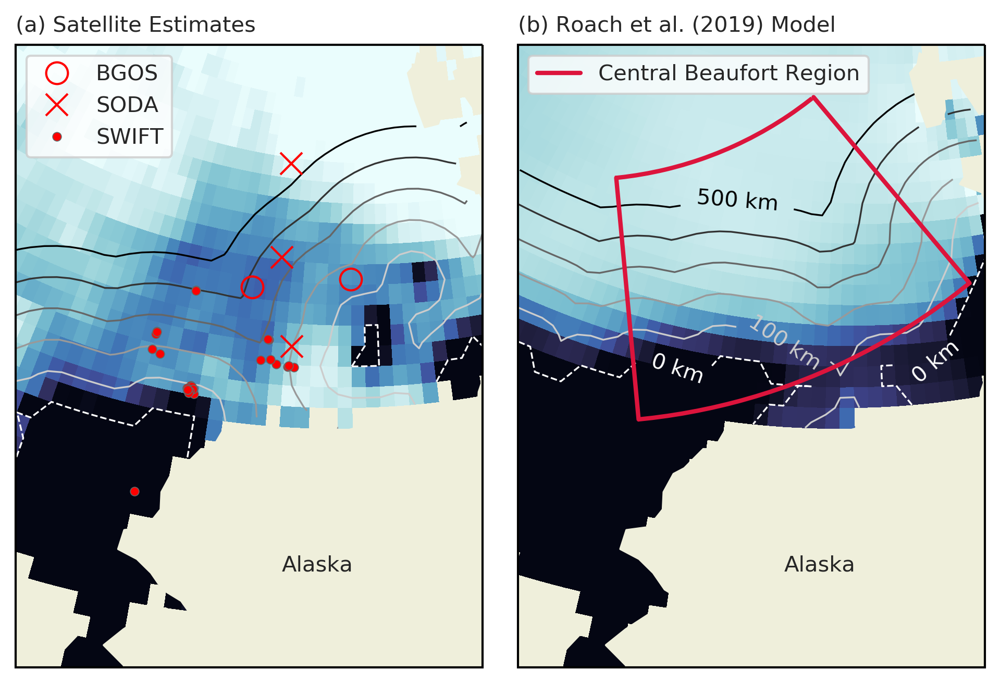

In [13]:
with sns.axes_style('ticks'):
    fig = plt.figure(figsize=(8,8),dpi=300)
    proj = ccrs.NorthPolarStereo(central_longitude=190-360)
    
    timeslice=slice('2018-07-23','2018-07-23')

    ax1 = plt.subplot(121,projection=proj)
    ax1.set_extent([-174,-142,65,82])
    ## beaufort-chukchi is 180, 140,66,82

    levels = np.linspace(0,500,6)

    ## pcolormesh of concentration
    g = boot.aice_d.sel(
        time=timeslice)[0].plot.pcolormesh(
        'TLON','TLAT',add_colorbar=False,#cbar_kwargs={'label':'Ice Concentration'},
        cmap=cmocean.cm.ice,vmax=1,
        ax=ax1,transform=ccrs.PlateCarree())


    ## Contour lines for distance ##
    contourp = dist_sat_all.cdr.sel(
        time=timeslice)[0].where(dist_sat_all.TLON > 180).plot.contour(
        'TLON','TLAT',
        levels=[0,100,200,300,400,500],linewidths=0.8,
        linestyles=['--','-','-','-','-','-'],
        add_colorbar=False,
        cmap='gist_yarg',
        ax=ax1,transform=ccrs.PlateCarree())
    dist_sat_all.cdr.sel(
        time=timeslice)[0].where(dist_sat_all.TLON < 180).plot.contour(
        'TLON','TLAT',
        levels=[0,100,200,300,400,500],linewidths=0.8,
        linestyles=['--','-','-','-','-','-'],
        add_colorbar=False,
        cmap='gist_yarg',
        ax=ax1,transform=ccrs.PlateCarree())

    ## skip contour labels on satellite plot
#     plt.clabel(contourp,[0,500],fontsize=10,fmt='%d km',
#                colors=['w','k','0.3','k','k','k'],
#                inline_spacing=30)

    ## Scatter plots for observation locations
    # BGEP
    ax1.plot(210,75,marker='o',c='r',markersize=10,mfc='none',linewidth=0,label='BGOS',
            transform=ccrs.PlateCarree())
    ax1.plot(220,74,marker='o',c='r',markersize=10,mfc='none',linewidth=0,label='',
            transform=ccrs.PlateCarree())

    # SODA
    ax1.plot(211.66,73.00,marker='x',c='r',markersize=10,linewidth=0,label='SODA',
            transform=ccrs.PlateCarree())
    ax1.plot(214.36,75.46,marker='x',c='r',markersize=10,
            transform=ccrs.PlateCarree())
    ax1.plot(220.86,77.74,marker='x',c='r',markersize=10,
            transform=ccrs.PlateCarree())

    # SWIFT
    for key,da in swift_dict.items():
        ax1.plot(da.lon.mean(),da.lat.mean(),marker='o',mec='0.4',mfc='r',markersize=4,mew=0.4,
                 alpha=1,
                 transform=ccrs.PlateCarree())
    ax1.plot(da.lon.mean(),da.lat.mean(),marker='o',mec='0.4',mfc='r',markersize=4,mew=0.4,lw=0,
             label='SWIFT',transform=ccrs.PlateCarree())

    ax1.text(205, 67, 'Alaska', fontsize=10, transform=ccrs.PlateCarree())
    ax1.add_feature(cfeature.LAND,zorder=2)
    ax1.add_feature(cfeature.OCEAN,zorder=0,color=cfeature.COLORS['land'],edgecolor='k')
    ax1.set_title('')
    plt.title('(a) Satellite Estimates',loc='left',fontsize=10)
    plt.legend(loc='upper left',fontsize=10)
    
    ################################
    ax2 = plt.subplot(122,projection=proj)
    ax2.set_extent([-174,-142,65,82])

    levels = np.linspace(0,500,6)

    ## pcolormesh of concentration
    pc = ice_conc_data.plot.pcolormesh(
        'longitude','latitude',add_colorbar=False,#cbar_kwargs={'label':'Ice Concentration'},
        cmap=cmocean.cm.ice,vmax=1,
        ax=ax2,transform=ccrs.PlateCarree())
    
#     plt.colorbar(pc,label='Ice Concentration',shrink=0.7)

    ## Contour lines for distance ##
    contourp = distances_da.where(distances_da.longitude >= 180).plot.contour(
        'longitude','latitude',
        levels=[0,100,200,300,400,500],linewidths=0.8,
        linestyles=['--','-','-','-','-','-'],
        add_colorbar=False,
        cmap='gist_yarg',
        ax=ax2,transform=ccrs.PlateCarree())
    
    distances_da.where(distances_da.longitude <= 180).plot.contour(
        'longitude','latitude',
        levels=[0,100,200,300,400,500],linewidths=0.8,
        add_colorbar=False,
        cmap='gist_yarg',
        ax=ax2,transform=ccrs.PlateCarree())

    plt.clabel(contourp,[0,100,500],fontsize=10,fmt='%d km',
               colors=['w','0.8','k','k','k','k'],
               inline_spacing=30)
    
    ## dummy for beaufort patch
    distances_da.latitude.where((distances_da.longitude >= lonmin) & 
                                (distances_da.longitude <= lonmax)).plot.contour(
        'longitude','latitude',
        levels=[latmin,latmax],linewidths=2,
        add_colorbar=False,
        colors='crimson',
        ax=ax2,transform=ccrs.PlateCarree())
    
    ax2.plot([lonmin+0.6,lonmin+0.8],[latmin,latmax],marker='',c='crimson',lw=2,
             label='Central Beaufort Region',
             transform=ccrs.PlateCarree())
    ax2.plot([lonmax-0.8,lonmax-1.3],[latmin,latmax],marker='',c='crimson',lw=2,
             transform=ccrs.PlateCarree())
    

    ax2.text(205, 67, 'Alaska', fontsize=10, transform=ccrs.PlateCarree())
    ax2.add_feature(cfeature.LAND,zorder=2)
    ax2.add_feature(cfeature.OCEAN,zorder=0,color=cfeature.COLORS['land'],edgecolor='k')
    # ax2.coastlines(zorder=5)
    # ax2.gridlines()
    plt.title('',loc='center')
    plt.title('(b) Roach et al. (2019) Model',loc='left',fontsize=10)
    plt.legend(loc='upper left',fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.075)
    plt.show()

# Figure 2: Histograms of $H_s$
And supporting processing.

Aggregate observations, and in the process, print N of datasets for waves in ice.
These N values are used for Summary of Obs table.

Then, aggregate model data from central Beaufort.

In [14]:
## aggregate BGOS-SODA observations of Hs and fp and corresponding distance
## print out N of valid wave obs in ice for Table

month_limit = False
month_sel = 10
timeslice = slice('2012-01-01','2019-12-31')
# month_sel = 7 # choose true number of month (not python index, so Jan = 1)
sat = 'cdr'

hs = np.array([])
fp = np.array([])
dist = np.array([])
hsmin = [] # dummy

hs_total = hs.copy() # array to hold all obs
fp_total = hs.copy() # array to hold all obs
dist_total = dist.copy() #  array to hold all obs

setmin = 0.29

obname = 'bgosA'
dist,hs = get_dist_hs(sat,obname)
dist,fp = get_dist_period(sat,obname)
fp = 1/fp # convert to peak freq
if month_limit:
    dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
    hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
    fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
hsmin = np.append(hsmin,np.min(hs))
print(hs.size,hsmin,hs[(hs > setmin) & (dist > 100)].size)
print(obname, hs[(hs > setmin) & (dist > 0) & (dist < 100)].size, 
      hs[(hs > setmin) & (dist > 100)].size)
hs_total = np.append(hs_total, hs)
fp_total = np.append(fp_total, fp)
dist_total = np.append(dist_total, dist)

obname = 'bgosD'
dist,hs = get_dist_hs(sat,obname)
dist,fp = get_dist_period(sat,obname)
fp = 1/fp # convert to peak freq
if month_limit:
    dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
    hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
    fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
hsmin = np.append(hsmin,np.min(hs))
print(hs.size,hsmin,hs[(hs > setmin) & (dist > 100)].size)
print(obname, hs[(hs > setmin) & (dist > 0) & (dist < 100)].size, 
      hs[(hs > setmin) & (dist > 100)].size)
hs_total = np.append(hs_total, hs)
fp_total = np.append(fp_total, fp)
dist_total = np.append(dist_total, dist)

obname = 'sodaA'
dist,hs = get_dist_hs(sat,obname)
dist,fp = get_dist_period(sat,obname)
fp = 1/fp # convert to peak freq
if month_limit:
    dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
    hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
    fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
hsmin = np.append(hsmin,np.min(hs))
print(hs.size,hsmin,hs[(hs > setmin) & (dist > 100)].size)
print(obname, hs[(hs > setmin) & (dist > 0) & (dist < 100)].size, 
      hs[(hs > setmin) & (dist > 100)].size)
hs_total = np.append(hs_total, hs)
fp_total = np.append(fp_total, fp)
dist_total = np.append(dist_total, dist)

obname = 'sodaB'
dist,hs = get_dist_hs(sat,obname)
dist,fp = get_dist_period(sat,obname)
fp = 1/fp # convert to peak freq
if month_limit:
    dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
    hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
    fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
hsmin = np.append(hsmin,np.min(hs))
print(hs.size,hsmin,hs[(hs > setmin) & (dist > 100)].size)
print(obname, hs[(hs > setmin) & (dist > 0) & (dist < 100)].size, 
      hs[(hs > setmin) & (dist > 100)].size)
hs_total = np.append(hs_total, hs)
fp_total = np.append(fp_total, fp)
dist_total = np.append(dist_total, dist)

obname = 'sodaC'
dist,hs = get_dist_hs(sat,obname)
dist,fp = get_dist_period(sat,obname)
fp = 1/fp # convert to peak freq
if month_limit:
    dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
    hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
    fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
hsmin = np.append(hsmin,np.min(hs))
print(hs.size,hsmin,hs[(hs > setmin) & (dist > 100)].size)
print(obname, hs[(hs > setmin) & (dist > 0) & (dist < 100)].size, 
      hs[(hs > setmin) & (dist > 100)].size)
hs_total = np.append(hs_total, hs)
fp_total = np.append(fp_total, fp)
dist_total = np.append(dist_total, dist)

## create separate totals
disttemp = dist_total[dist_total > 100]
hstemp = hs_total[dist_total > 100]
hstemp_0 = hs_total[dist_total < .0001]
hstemp_0to100 = hs_total[(dist_total < 100) & (dist_total > 0)]
hstemp_100less = hs_total[dist_total < 100]

fptemp = fp_total[dist_total > 100]
fptemp_0 = fp_total[dist_total < .0001]
fptemp_0to100 = fp_total[(dist_total < 100) & (dist_total > 0)]
hstemp_100less = hs_total[dist_total < 100]

4993 [0.10253083] 68
bgosA 28 68
2077 [0.10253083 0.10044342] 4
bgosD 84 4
1288 [0.10253083 0.10044342 0.10689223] 10
sodaA 39 10
486 [0.10253083 0.10044342 0.10689223 0.12930967] 3
sodaB 99 3
20 [0.10253083 0.10044342 0.10689223 0.12930967 0.28915935] 19
sodaC 0 19


In [15]:
## BGOS-SODA total N of obs in ice
print(hstemp_0to100[hstemp_0to100 > setmin].size,hstemp[hstemp > setmin].size)

250 104


In [16]:
## repeat for SWIFTs
n_0to100 = []
n_100plus = []

for key,val in insitu_dict.items():
    if 'SWIFT' in key:
        tempn_0to100 = (~np.isnan(
            val.cdr.where((val.cdr > 0) & (val.cdr < 100) & 
                          (val.sigwaveheight > setmin)).values)*1).sum()
        tempn_100plus = (~np.isnan(
            val.cdr.where((val.cdr > 100) & (val.sigwaveheight > setmin)).values)*1).sum()
        
        n_0to100.append(tempn_0to100)
        n_100plus.append(tempn_100plus)
#         print(val.time.min().values, val.time.max().values)
    
print(np.array(n_0to100).sum(), np.array(n_100plus).sum(), '[SWIFT 0-100 and 100+, but 2nd number is wrong]')

838 46 [SWIFT 0-100 and 100+, but 2nd number is wrong]


In [17]:
## 46 above is wrong because of the error on 12 Oct 2015 we found;
## exclude those observations and use this instead
tempkey = 'SWIFT11_10Oct2015'
distmin = 100
tempe = xr.where((insitu_dict[tempkey].sigwaveheight > setmin) & 
         (insitu_dict[tempkey].cdr > 100),
         (9.81*insitu_dict[tempkey].sigwaveheight/4/insitu_dict[tempkey].wind**2)**2,np.nan).values

tempf = xr.where((insitu_dict[tempkey].sigwaveheight > setmin) & 
         (insitu_dict[tempkey].cdr > 100),
                 insitu_dict[tempkey].wind/insitu_dict[tempkey].peakwaveperiod/9.81,np.nan).values
tempsum = np.nansum(tempf/tempf)

tempkey = 'SWIFT14_10Oct2015'
tempe = xr.where((insitu_dict[tempkey].sigwaveheight > setmin) & 
         (insitu_dict[tempkey].cdr > distmin),
         (9.81*insitu_dict[tempkey].sigwaveheight/4/insitu_dict[tempkey].wind**2)**2,np.nan).values

tempf = xr.where((insitu_dict[tempkey].sigwaveheight > setmin) & 
         (insitu_dict[tempkey].cdr > 100),
                 insitu_dict[tempkey].wind/insitu_dict[tempkey].peakwaveperiod/9.81,np.nan).values
tempsum = np.nansum(tempf/tempf) + tempsum
print(tempsum, 'SWIFT N beyond 100 km')

23.0 SWIFT N beyond 100 km


In [18]:
## create subset to just get one month at a time
## right now, this function only returns the open water results
def hs_fp_bymon(month_sel):
    ## get the observations

    month_limit = True
#     month_sel = 10
    timeslice = slice('2012-01-01','2019-12-31')
    # month_sel = 7 # choose true number of month (not python index at 0, so Jan = 1)
    sat = 'cdr'

    hs = np.array([])
    fp = np.array([])
    dist = np.array([])
    hsmin = [] # dummy

    hs_total = hs.copy() # array to hold all obs
    fp_total = hs.copy() # array to hold all obs
    dist_total = dist.copy() #  array to hold all obs

    hs_threshold = setmin

    dist,hs = get_dist_hs(sat,'bgosA')
    dist,fp = get_dist_period(sat,'bgosA')
    fp = 1/fp # convert to peak freq
    if month_limit:
        dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
        hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
        fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
    hsmin = np.append(hsmin,np.min(hs))
#     print(hs.size,hsmin,hs[hs > setmin].size)
    hs_total = np.append(hs_total, hs)
    fp_total = np.append(fp_total, fp)
    dist_total = np.append(dist_total, dist)

    dist,hs = get_dist_hs(sat,'bgosD')
    dist,fp = get_dist_period(sat,'bgosD')
    fp = 1/fp # convert to peak freq
    if month_limit:
        dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
        hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
        fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
    hsmin = np.append(hsmin,np.min(hs))
#     print(hs.size,hsmin,hs[hs > setmin].size)
    hs_total = np.append(hs_total, hs)
    fp_total = np.append(fp_total, fp)
    dist_total = np.append(dist_total, dist)

    dist,hs = get_dist_hs(sat,'sodaA')
    dist,fp = get_dist_period(sat,'sodaA')
    fp = 1/fp # convert to peak freq
    if month_limit:
        dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
        hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
        fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
    hsmin = np.append(hsmin,np.min(hs))
#     print(hs.size,hsmin,hs[hs > setmin].size)
    hs_total = np.append(hs_total, hs)
    fp_total = np.append(fp_total, fp)
    dist_total = np.append(dist_total, dist)

    dist,hs = get_dist_hs(sat,'sodaB')
    dist,fp = get_dist_period(sat,'sodaB')
    fp = 1/fp # convert to peak freq
    if month_limit:
        dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
        hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
        fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
    hsmin = np.append(hsmin,np.min(hs))
#     print(hs.size,hsmin,hs[hs > setmin].size)
    hs_total = np.append(hs_total, hs)
    fp_total = np.append(fp_total, fp)
    dist_total = np.append(dist_total, dist)

    dist,hs = get_dist_hs(sat,'sodaC')
    dist,fp = get_dist_period(sat,'sodaC')
    fp = 1/fp # convert to peak freq
    if month_limit:
        dist = dist.where(pd.DatetimeIndex(dist.time.values).month == month_sel)
        hs = hs.where(pd.DatetimeIndex(hs.time.values).month == month_sel)
        fp = fp.where(pd.DatetimeIndex(fp.time.values).month == month_sel)
    hsmin = np.append(hsmin,np.min(hs))
#     print(hs.size,hsmin,hs[hs > setmin].size)
    hs_total = np.append(hs_total, hs)
    fp_total = np.append(fp_total, fp)
    dist_total = np.append(dist_total, dist)

    ## create separate totals
    hstemp = hs_total[dist_total > 100]
    hstemp_0 = hs_total[dist_total < .0001]
    hstemp_0to100 = hs_total[(dist_total < 100) & (dist_total > 0)]
    hstemp_100less = hs_total[dist_total < 100]

    fptemp = fp_total[dist_total > 100]
    fptemp_0 = fp_total[dist_total < .0001]
    fptemp_0to100 = fp_total[(dist_total < 100) & (dist_total > 0)]
    hstemp_100less = hs_total[dist_total < 100]
    
    ## only return the open water distributions
    return(hstemp_0,fptemp_0)

In [19]:
## melt season and growth season; aggregate BGOS and SODA
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    ## group 6-8
    obs_hs_melt_0 = np.array([])
    obs_fp_melt_0 = np.array([])

    temp1, temp2 = hs_fp_bymon(6);
    obs_hs_melt_0 = np.append(obs_hs_melt_0,temp1)
    obs_fp_melt_0 = np.append(obs_fp_melt_0,temp2)

    temp1, temp2 = hs_fp_bymon(7);
    obs_hs_melt_0 = np.append(obs_hs_melt_0,temp1)
    obs_fp_melt_0 = np.append(obs_fp_melt_0,temp2)

    temp1, temp2 = hs_fp_bymon(8);
    obs_hs_melt_0 = np.append(obs_hs_melt_0,temp1)
    obs_fp_melt_0 = np.append(obs_fp_melt_0,temp2)

    ########
    ## group 10 and 11
    obs_hs_grow_0 = np.array([])
    obs_fp_grow_0 = np.array([])

    ## October not common in new model run, but need it for obs comparison
    temp1, temp2 = hs_fp_bymon(10);
    obs_hs_grow_0 = np.append(obs_hs_grow_0,temp1)
    obs_fp_grow_0 = np.append(obs_fp_grow_0,temp2)

    temp1, temp2 = hs_fp_bymon(11);
    obs_hs_grow_0 = np.append(obs_hs_grow_0,temp1)
    obs_fp_grow_0 = np.append(obs_fp_grow_0,temp2)

In [20]:
%%time
## aggregate model results
beau_hs = ww_allbeau.hs.where((ww_allbeau.dist > 100) & (ww_allbeau.fp > 0))
vbeau_hs = beau_hs.values[~np.isnan(beau_hs)] ## vbeau is a vector of all Beaufort grid cells at all times

beau_fp = ww_allbeau.fp.where((ww_allbeau.dist > 100) & (ww_allbeau.fp > 0))
vbeau_fp = beau_fp.values[~np.isnan(beau_fp)]

beau_hs_0to100 = ww_allbeau.hs.where((ww_allbeau.dist > 0) & (ww_allbeau.dist < 100) & (ww_allbeau.fp > 0))
vbeau_hs_0to100 = beau_hs_0to100.values[~np.isnan(beau_hs_0to100)]

beau_fp_0to100 = ww_allbeau.fp.where((ww_allbeau.dist > 0) & (ww_allbeau.dist < 100) & (ww_allbeau.fp > 0))
vbeau_fp_0to100 = beau_fp_0to100.values[~np.isnan(beau_fp_0to100)]

beau_hs_0 = ww_allbeau.hs.where((ww_allbeau.dist == 0) & (ww_allbeau.fp > 0))
vbeau_hs_0 = beau_hs_0.values[~np.isnan(beau_hs_0)]

beau_fp_0 = ww_allbeau.fp.where((ww_allbeau.dist == 0) & (ww_allbeau.fp > 0))
vbeau_fp_0 = beau_fp_0.values[~np.isnan(beau_fp_0)]

CPU times: user 1.07 s, sys: 1.45 s, total: 2.51 s
Wall time: 4.39 s


In [21]:
%%time
## also get separate model open water data for melt and growth seasons
## create model array for November only
hsmin = 0.3 ## minimum for obs comparison
vbeau_fp_0_grow = np.array([])

ttemp = beau_fp_0.where((beau_hs_0 > hsmin) & 
                       ((beau_fp_0.time.dt.month == 10) | (beau_fp_0.time.dt.month == 11)))
vbeau_fp_0_grow = ttemp.values[~np.isnan(ttemp)]

ttemp = beau_hs_0.where((beau_hs_0 > hsmin) & 
                       ((beau_fp_0.time.dt.month == 10) | (beau_fp_0.time.dt.month == 11)))
vbeau_hs_0_grow = ttemp.values[~np.isnan(ttemp)]


## create model array for Jun-Jul-Aug
vbeau_fp_0_melt = np.array([])
ttemp = beau_fp_0.where((beau_hs_0 > hsmin) & 
                       ((beau_fp_0.time.dt.month == 6) | 
                        (beau_fp_0.time.dt.month == 7) | 
                        (beau_fp_0.time.dt.month == 8)))
vbeau_fp_0_melt = ttemp.values[~np.isnan(ttemp)]

ttemp = beau_hs_0.where((beau_hs_0 > hsmin) & 
                       ((beau_fp_0.time.dt.month == 6) | 
                        (beau_fp_0.time.dt.month == 7) | 
                        (beau_fp_0.time.dt.month == 8)))
vbeau_hs_0_melt = ttemp.values[~np.isnan(ttemp)]

CPU times: user 502 ms, sys: 484 ms, total: 986 ms
Wall time: 985 ms


### Figure 1

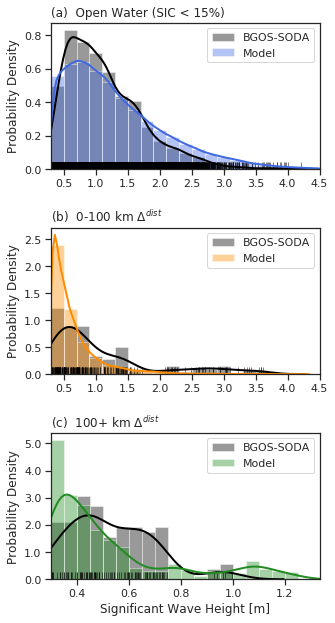

In [22]:
## 1d histogram obs and model
## BEAUFORT REGION

with sns.axes_style('ticks'):
    fig,ax = plt.subplots(3,1,figsize=(5,9),dpi=72) ## change to dpi 300 for press quality
#     mpl.rcParams['figure.dpi'] = 300 # activate for presentation quality # 72 normal

    minorticks()
    
    plt.sca(ax[0])
    setmin = 0.3
    setmax = 4.5
    nbins = 21
    model_hs = vbeau_hs_0[vbeau_hs_0 > setmin]
    obs_hs = hstemp_0[hstemp_0 > setmin]
    
    ax1 = sns.distplot(obs_hs,bins=nbins,kde=True,rug=True,
                       color='k',
                       label='BGOS-SODA',
#                        rug_kws={'lw':0.1},
                       hist_kws={'range':(setmin,setmax)},rug_kws={'alpha':0.7,'lw':0.7},
                       kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]})
    sns.distplot(model_hs,bins=nbins,kde=True,
                 color='royalblue',
                 label='Model',
                 hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]},
                 ax=ax1)
#     plt.title('Distribution of Significant Wave Height at 100+ km Inside MIZ')
    plt.ylabel('Probability Density')
    plt.xlabel('')
    plt.xticks(np.arange(0.5,4.5+0.1,0.5))
    plt.xlim(setmin,setmax)
    plt.title('(a)  Open Water (SIC < 15%)',loc='left')
    plt.legend()

    ########
    plt.sca(ax[1])
    setmax = 4.5
    nbins = 21
    model_hs = vbeau_hs_0to100[vbeau_hs_0to100 > setmin]
    obs_hs = hstemp_0to100[hstemp_0to100 > setmin]

    ax1 = sns.distplot(obs_hs,bins=nbins,kde=True,rug=True,
                       color='k',
                       label='BGOS-SODA',
                       hist_kws={'range':(setmin,setmax)},rug_kws={'alpha':0.7,'lw':0.7},
                       kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]})
    sns.distplot(model_hs,bins=nbins,kde=True,
                 color='darkorange',
                 label='Model',
                 hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]},
                 ax=ax1)
#     plt.title('Distribution of Significant Wave Height at 100+ km Inside MIZ')
    plt.ylabel('Probability Density')
    plt.xlabel('')
#     plt.xticks(np.linspace(0.4,1.2,5))
    plt.xticks(np.arange(0.5,4.5+0.1,0.5))
    plt.xlim(setmin,setmax)
    plt.title('(b)  0-100 km $\Delta^{dist}$',loc='left')
    plt.legend()
    
    ############
    plt.sca(ax[2])
    setmax = 1.3
    nbins = 20

    temphs = vbeau_hs
    model_hs = temphs[temphs > setmin]
    obs_hs = hstemp[hstemp > setmin]    
    ax1 = sns.distplot(obs_hs,bins=nbins,kde=True,rug=True,
                       color='k',
                       label='BGOS-SODA',
                       hist_kws={'range':(setmin,setmax)},rug_kws={'alpha':0.7,'lw':0.7},
                       kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]})
    sns.distplot(model_hs,bins=nbins,kde=True,
                 color='forestgreen',
                 label='Model',
                 hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]},
                 ax=ax1)
#     plt.title('Distribution of Significant Wave Height at 100+ km Inside MIZ')
    plt.ylabel('Probability Density')
    plt.xlabel('Significant Wave Height [m]')
    plt.xticks(np.linspace(0.4,1.2,5))
    plt.xlim(setmin,1.333333)
    plt.title('(c)  100+ km $\Delta^{dist}$',loc='left')
    ax1.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:.1f}"))
    plt.legend()

    plt.tight_layout()
    plt.show()

In [23]:
## max model wave at 100+
print(vbeau_hs.max())

1.2497404


In [24]:
## fraction of waves greater than 1 m
print(model_hs[model_hs > 1.0].size / model_hs.size)
print(obs_hs[obs_hs > 1.0].size / obs_hs.size)

print(model_hs[model_hs > 0.75].size / model_hs.size)
print(obs_hs[obs_hs > 0.75].size / obs_hs.size)

0.09467455621301775
0.0
0.1755424063116371
0.04807692307692308


In [25]:
## quick numbers for paragraph in paper
## percentage of 100+ dist waves in model greater than 1.0 m
Nall = model_hs[model_hs > setmin] / model_hs[model_hs > setmin]
Nall = Nall.sum()

N_over1 = model_hs[model_hs > 1.0] / model_hs[model_hs > 1.0]
N_over1 = N_over1.sum()

print('Fraction of model waves with H_s > 1.0 m at 100+ km: ', N_over1/Nall)
print('Total number of observed waves at 100+ km: ', obs_hs[obs_hs > setmin].size)
print('Fraction of observed waves at 100+ km exceeding 0.75 m: ', 
      obs_hs[obs_hs > 0.75].size/obs_hs[obs_hs > setmin].size)

Fraction of model waves with H_s > 1.0 m at 100+ km:  0.09467456
Total number of observed waves at 100+ km:  104
Fraction of observed waves at 100+ km exceeding 0.75 m:  0.04807692307692308


In [26]:
setmin = 0.3
setmax = 4.5
model_hs = vbeau_hs_0[vbeau_hs_0 > setmin]
obs_hs = hstemp_0[hstemp_0 > setmin]

## fraction of open water waves greater than 2 m
print(model_hs[model_hs > 2].size / model_hs.size)
print(obs_hs[obs_hs > 2].size / obs_hs.size)

0.17968983843685393
0.09070631970260223


In [27]:
model_hs = vbeau_hs_0to100[vbeau_hs_0to100 > setmin]
obs_hs = hstemp_0to100[hstemp_0to100 > setmin]

## fraction of waves greater than 1 m at 0-100 km
print(model_hs[model_hs > 1.0].size / model_hs.size)
print(obs_hs[obs_hs > 1.0].size / obs_hs.size)

0.12716529311149122
0.3522267206477733


#### Supplemental Figure: $f_p$ and $H_s$ open water dist., melt vs growth season

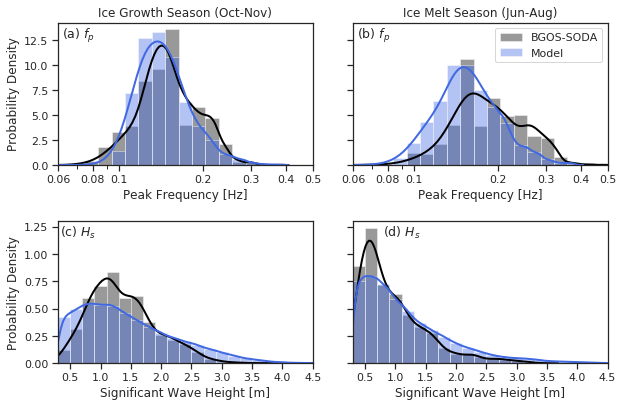

In [28]:
with sns.axes_style('ticks'):
    fig,axs = plt.subplots(2,2,figsize=(9,6),dpi=72,sharey='row') ## set at 300 for press quality
    
    plt.sca(axs[0,0])
    ## grow season 10 11
    ## peak frequency: open water
    ## BEAUFORT REGION
    setmin = 6e-2
    setmax = 5e-1
    hsmin = 0.33
    nbins = 20
    bins = np.logspace(np.log10(setmin),np.log10(setmax),nbins)

    model_fp = vbeau_fp_0_grow#[vbeau_hs_0_grow > hsmin]
    obs_fp = obs_fp_grow_0[obs_hs_grow_0 > hsmin]


    minorticks()
    ax1 = sns.distplot(obs_fp,bins=bins,kde=True,rug=False,
                       color='k',
                       label='',
#                        hist_kws={'range':(setmin,setmax)},
                       kde_kws={'linewidth':2,'bw':'scott',
                                'label':'','clip':[setmin,setmax]})
    sns.distplot(model_fp,bins=bins,kde=True,
                 color='royalblue',
                 label='',
#                  hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':.01,'label':'','clip':[setmin,setmax]},
                 ax=ax1)
    plt.title('Ice Growth Season (Oct-Nov)')
    plt.text(0.062,12.7,'(a) $f_p$',fontsize='x-small')
    plt.ylabel('Probability Density')
    plt.xlabel('Peak Frequency [Hz]')
#     plt.xticks(np.linspace(0.4,1.0,4))
    plt.xlim(setmin,setmax)
#     plt.legend()
    plt.xscale('log')
    plt.tick_params(axis='x', which='minor',labelsize=105)

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str))


    ## melt season 6 7 8
    ## peak frequency: open water
    ## BEAUFORT REGION
    plt.sca(axs[0,1])
    setmin = 6e-2
    setmax = 5e-1
    hsmin = 0.33
    nbins = 20
    bins = np.logspace(np.log10(setmin),np.log10(setmax),nbins)

    model_fp = vbeau_fp_0_melt
    obs_fp = obs_fp_melt_0[obs_hs_melt_0 > hsmin]

    ax1 = sns.distplot(obs_fp,bins=bins,kde=True,rug=False,
                       color='k',
                       label='BGOS-SODA',
#                        hist_kws={'range':(setmin,setmax)},
                       kde_kws={'linewidth':2,'bw':'scott',
                                'label':'','clip':[setmin,setmax]})
    sns.distplot(model_fp,bins=bins,kde=True,
                 color='royalblue',
                 label='Model',
#                  hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':0.01,'label':'','clip':[setmin,setmax]},
                 ax=ax1)
    plt.title('Ice Melt Season (Jun-Aug)')
    plt.ylabel('')
    plt.xlabel('Peak Frequency [Hz]')
#     plt.xticks(np.linspace(0.4,1.0,4))
    plt.xlim(setmin,setmax)
    plt.legend()
    plt.xscale('log')
    plt.text(0.062,12.7,'(b) $f_p$',fontsize='x-small')
    plt.tick_params(axis='x', which='minor',labelsize=105)

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str))

    ## grow season 10 11
    ## Hs: open water
    plt.sca(axs[1,0])
    setmin = 0.3
    setmax = 4.5
    hsmin = 0.3
    nbins = 21
    # bins = np.logspace(np.log10(setmin),np.log10(setmax),nbins)

    model = vbeau_hs_0_grow#[vbeau_hs_0_grow > hsmin]
    obs = obs_hs_grow_0[obs_hs_grow_0 > hsmin]

    ax1 = sns.distplot(obs,kde=True,rug=False,bins=nbins,
                       color='k',
                       label='',
                       hist_kws={'range':(setmin,setmax)},
                       kde_kws={'linewidth':2,'bw':'scott',
                                'label':'','clip':[setmin,setmax]})
    sns.distplot(model,kde=True,bins=nbins,
                 color='royalblue',
                 label='',
                 hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]},
                 ax=ax1)
    plt.ylabel('Probability Density')
    plt.xlabel('Significant Wave Height [m]')
    plt.text(0.34,1.16,'(c) $H_s$',fontsize='x-small')
    plt.xticks(np.arange(0.5,4.5+.1,0.5))
    plt.xlim(setmin,setmax)
#     plt.legend()
    
    ## melt season
    ## Hs: open water
    plt.sca(axs[1,1])
    setmin = 0.3
    setmax = 4.5
    hsmin = 0.3
    nbins = 21

    model = vbeau_hs_0_melt
    obs = obs_hs_melt_0[obs_hs_melt_0 > hsmin]

    ax1 = sns.distplot(obs,kde=True,rug=False,bins=nbins,
                       color='k',
                       label='',
                       hist_kws={'range':(setmin,setmax)},
                       kde_kws={'linewidth':2,'bw':'scott',
                                'label':'','clip':[setmin,setmax]})
    sns.distplot(model,kde=True,bins=nbins,
                 color='royalblue',
                 label='',
                 hist_kws={'range':(setmin,setmax)},
                 kde_kws={'linewidth':2,'bw':'scott','label':'','clip':[setmin,setmax]},
                 ax=ax1)
    plt.xlabel('Significant Wave Height [m]')
    plt.text(0.8,1.16,'(d) $H_s$',fontsize='x-small')
    plt.xticks(np.arange(0.5,4.5+.1,0.5))
    plt.xlim(setmin,setmax)
    
    plt.tight_layout()
    plt.show()

# Figure 3: Spectra

Functions to aggregate model spectra, then plot with obs.

In [29]:
setmin = 0.3

## function to get all model spectra and reduce location and time into one dimension
def spectral_plot_model(distmin,distmax):

    # select the Spectra
    spectrum = ww1719ef_beau_cat.ef.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > setmin), 
        drop=True)

    # use numpy indexing to stack grid cells with time
    tempnp = (spectrum.stack(celltime=('time','nj','ni'))).values

    # get rid of all the spectral lines that are all nan (reduce data set)
    tempnp = tempnp[:,~np.all(np.isnan(tempnp[:]),axis=0)]

    # put back into xarray for plotting ease
    temp = xr.DataArray(
                tempnp,
                dims = ['f','celltime'],
                coords = {'f':spectrum.f})

    ## draw a maximum sample of 10000 celltimes
    ## this reduces size for plotting
    celltime_index = np.random.choice(
        temp.celltime.values,
        size=np.min([10000,temp.celltime.values.size]),
        replace=False)

    return(temp[:,celltime_index])

## define additional function that only gets model spectra when there is swell inside the ice
def spectral_plot_model_limit100(distmin,distmax,hsmin):

    ## Find times when waves are present at 100 + km
    init_spectrum = ww1719ef_beau_cat.ef.where(
        (ww1719beau_cat.dist > 100) & 
        (ww1719beau_cat.hs > hsmin), 
        drop=True)

    ## subset the spectra by those times
    spectrum = ww1719ef_beau_cat.ef.where(ww1719ef_beau_cat.time == init_spectrum.time)
    
    spectrum = spectrum.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > hsmin), 
        drop=True)

    # use numpy indexing to stack grid cells with time
    tempnp = (spectrum.stack(celltime=('time','nj','ni'))).values

    # get rid of all the spectral lines that are all nan (reduce data set)
    tempnp = tempnp[:,~np.all(np.isnan(tempnp[:]),axis=0)]

    # put back into xarray for plotting ease
    temp = xr.DataArray(
                tempnp,
                dims = ['f','celltime'],
                coords = {'f':spectrum.f})

    ## draw a maximum random sample of 10000 celltimes
    ## this reduces size for plotting
    celltime_index = np.random.choice(
        temp.celltime.values,
        size=np.min([10000,temp.celltime.values.size]),
        replace=False)

    return(temp[:,celltime_index])

## monthly version
def spectral_plot_model_mon(distmin,distmax,hsmin,season):
    ## season is either 'melt' or 'grow'
    
    monlist = np.array([])
    if (season == 'melt'):
        monlist = np.array([6,7,8])
    elif (season == 'growth'):
        monlist = np.array([10,11])
    print(monlist)

    # select the Spectra
    spectrum = ww1719ef_beau_cat.ef.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > hsmin) & 
        (ww1719beau_cat.time.dt.month.isin(monlist)), 
        drop=True)

    # use numpy indexing to stack grid cells with time
    tempnp = (spectrum.stack(celltime=('time','nj','ni'))).values

    # get rid of all the spectral lines that are all nan (reduce data set)
    tempnp = tempnp[:,~np.all(np.isnan(tempnp[:]),axis=0)]

    # put back into xarray for plotting ease
    temp = xr.DataArray(
                tempnp,
                dims = ['f','celltime'],
                coords = {'f':spectrum.f})

    ## draw a maximum random sample of 10000 celltimes
    ## this reduces size for plotting
    celltime_index = np.random.choice(
        temp.celltime.values,
        size=np.min([10000,temp.celltime.values.size]),
        replace=False)

    return(temp[:,celltime_index])

In [30]:
%%time
distmin = -0.1
distmax = 0.00001
setmin = 0.3
hsmin = setmin ## make sure minimum always at 0.3 m

open_water_spectra = spectral_plot_model(distmin,distmax)
MIZto100_spectra = spectral_plot_model(0,100)
over100_spectra = spectral_plot_model(100,1e9)

## new version with only waves when we have waves at 100+
open_water_spectra_limit100 = spectral_plot_model_limit100(distmin,distmax,hsmin)
MIZto100_spectra_limit100 = spectral_plot_model_limit100(0,100,hsmin)
over100_spectra_limit100 = spectral_plot_model_limit100(100,1e9,hsmin)

## split into melt and growth
season = 'melt'
open_water_spectra_melt = spectral_plot_model_mon(distmin,distmax,hsmin,season)
MIZto100_spectra_melt = spectral_plot_model_mon(0,100,hsmin,season)
over100_spectra_melt = spectral_plot_model_mon(100,1e9,hsmin,season)

season = 'growth'
open_water_spectra_growth = spectral_plot_model_mon(distmin,distmax,hsmin,season)
MIZto100_spectra_growth = spectral_plot_model_mon(0,100,hsmin,season)
over100_spectra_growth = spectral_plot_model_mon(100,1e9,hsmin,season)

[6 7 8]
[6 7 8]
[6 7 8]
[10 11]
[10 11]
[10 11]
CPU times: user 18.7 s, sys: 7.41 s, total: 26.1 s
Wall time: 33.1 s


#### Plot wave spectra

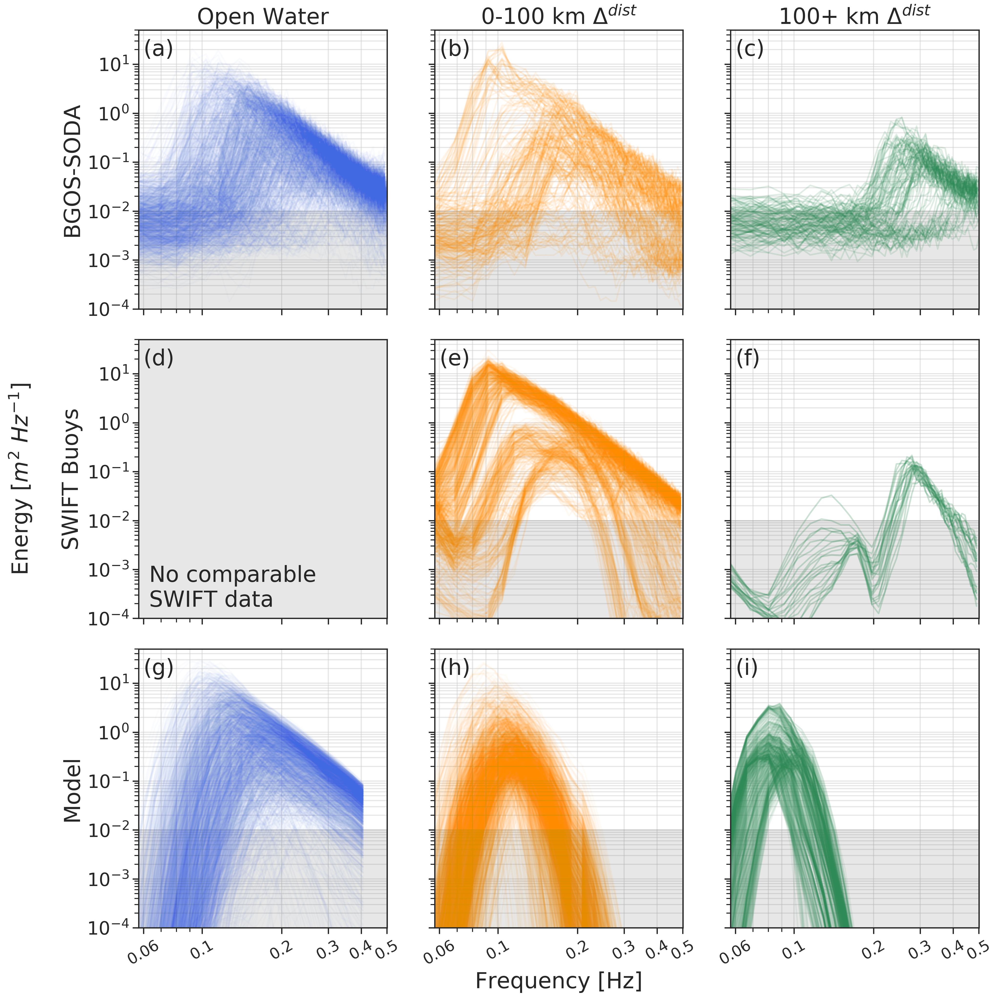

In [31]:
with sns.axes_style('white'):
    minorticks()
    fig,axs = plt.subplots(3,3,sharex=True,sharey=True,figsize=(14,14),dpi=300)
    
    ############### (a) ###########
    distmin = -0.1
    distmax = 0.0001
    
    for key,val in insitu_dict.items():
        if (key[0:5] != 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))

            ## limit to 500 samples from any individual instrument for plotting
            index = np.random.choice(np.arange(spectrum.time.size),
                 size=np.min([400,spectrum.time.size]),replace=False)
            
            spectrum[index].plot.line(
                        hue='time',alpha=0.025,add_legend=False,c='royalblue',ax=axs[0,0])
    
    ### NOISE FLOOR
    x = np.append([val.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[0,0].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[0,0].tick_params(axis='both', which='major',labelsize='medium')
    axs[0,0].tick_params(axis='both', which='minor',labelsize='medium')
    
    axs[0,0].grid(True,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
#     plt.ylabel('SWIFT Buoys\n \nEnergy [$m^2$ $Hz^{-1}$]',fontsize=18)
    axs[0,0].set_xlabel('')
    axs[0,0].set_ylabel(' \n \nBGOS-SODA',fontsize='large')
    axs[0,0].set_title('Open Water',fontsize='large')

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='large')
#     plt.xticks(ticks=xticklab,labels=[' '])
    axs[0,0].text(.06,15,'(a)',fontsize='large')
    
    
    
    ############# (b) ###########
    distmin = 0.0001
    distmax = 100
    
    for key,val in insitu_dict.items():
        if (key[0:5] != 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))

            spectrum.plot.line(
                        hue='time',alpha=0.08,add_legend=False,c='darkorange',ax=axs[0,1])
    
    ### NOISE FLOOR
    x = np.append([val.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[0,1].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[0,1].tick_params(axis='both', which='major', labelsize='small')
    axs[0,1].tick_params(axis='both', which='minor', labelsize='medium')
    
    
    axs[0,1].grid(True,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    axs[0,1].set_title('0-100 km $\Delta^{dist}$',fontsize='large')
    axs[0,1].set_xlabel('')
    axs[0,1].set_ylabel('')
    axs[0,1].text(.06,15,'(b)',fontsize='large')
    
    ############# (c) ###########
    distmin = 100
    distmax = 1e7
    
    for key,val in insitu_dict.items():
        if (key[0:5] != 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))

            spectrum.plot.line(
                        hue='time',alpha=0.15,add_legend=False,c='seagreen',ax=axs[0,2])
    
    ### NOISE FLOOR
    x = np.append([val.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[0,2].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[0,2].tick_params(axis='both', which='major', labelsize='small')
    axs[0,2].tick_params(axis='both', which='minor', labelsize='medium')
    
    
    axs[0,2].grid(True,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    axs[0,2].set_title('100+ km $\Delta^{dist}$',fontsize='large')
    axs[0,2].set_xlabel('')
    axs[0,2].set_ylabel('')
    axs[0,2].text(.06,15,'(c)',fontsize='large')
    
    ############### (d) ###########
    distmin = -1
    distmax = 0.01
    for key,val in insitu_dict.items():
        if (key[0:5] == 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))
            
            ## dummy IF statement to exclude the not-comparable open-water spectra
            if (spectrum.max().values > 100):
                spectrum.plot.line(
                        hue='time',alpha=0.3,add_legend=False,c='royalblue',ax=axs[1,0])
    
    ### NOISE FLOOR
#     x = np.append([val.freq_wavespectra.values],0.5)
#     nx = x.size
#     yupper = np.tile(1*10**(-2),nx)
#     ylower = np.tile(9*10**(-5),nx)
#     axs[1,0].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[1,0].tick_params(axis='both', which='major',labelsize='medium')
    axs[1,0].tick_params(axis='both', which='minor',labelsize='medium')
    
    axs[1,0].grid(False,which='both',alpha=0.00001)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    axs[1,0].set_xlabel('')
    axs[1,0].set_title('')
    axs[1,0].set_ylabel('Energy [$m^2$ $Hz^{-1}$]\n \nSWIFT Buoys',fontsize='large')
    axs[1,0].text(.06,15,'(d)',fontsize='large')
    
    axs[1,0].fill_between(x,10**(-5),10**2,alpha=0.1,color='0.1')
    axs[1,0].text(.063,1.75e-4,'No comparable\nSWIFT data',fontsize='large')
    
    ############### (e) ###########
    distmin = 0
    distmax = 100
    for key,val in insitu_dict.items():
        if (key[0:5] == 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))

            spectrum.plot.line(
                        hue='time',alpha=0.05,add_legend=False,c='darkorange',ax=axs[1,1])
    
    ### NOISE FLOOR
    x = np.append([val.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[1,1].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[1,1].tick_params(axis='both', which='major',labelsize='medium')
    axs[1,1].tick_params(axis='both', which='minor',labelsize='medium')
    
    axs[1,1].grid(True,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    axs[1,1].set_xlabel('')
    axs[1,1].set_title('')
    axs[1,1].set_ylabel('')
    axs[1,1].text(.06,15,'(e)',fontsize='large')
    
    ############### (f) ###########
    distmin = 100
    distmax = 1e7
    for key,val in insitu_dict.items():
        if (key[0:5] == 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))
            
            ## dummy if statement to exclude spectra miscategorized as 100+
            if (spectrum.max().values < 1):
                spectrum.plot.line(
                        hue='time',alpha=0.25,add_legend=False,c='seagreen',ax=axs[1,2])
    
    ### NOISE FLOOR
    x = np.append([val.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[1,2].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[1,2].tick_params(axis='both', which='major',labelsize='medium')
    axs[1,2].tick_params(axis='both', which='minor',labelsize='medium')
    
    axs[1,2].grid(False,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    axs[1,2].set_xlabel('')
    axs[1,2].set_title('')
    axs[1,2].set_ylabel('')
    axs[1,2].text(.06,15,'(f)',fontsize='large')
    

    ############# (g) ###########
    
    open_water_spectra[:,0:2000].plot.line(
        hue='celltime',alpha=0.020,add_legend=False,
        xscale='log',yscale='log',ax=axs[2,0],
        c='royalblue')
    
    axs[2,0].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')
    axs[2,0].tick_params(axis='both', which='major', labelsize='medium')
    axs[2,0].tick_params(axis='both', which='minor', labelsize='medium')
    
    
    axs[2,0].grid(True,which='both',alpha=0.5)
    axs[2,0].set_xlabel('')
    axs[2,0].set_ylabel(' \n \nModel',fontsize='large')
    axs[2,0].text(.06,15,'(g)',fontsize='large')
    xticklab = np.array([0.06,0.1,0.2,0.3,0.4,0.5])
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='small',rotation=30)

    ############# (h) ###########
    
    MIZto100_spectra[:,0:2000].plot.line(
        hue='celltime',alpha=0.03,add_legend=False,
        xscale='log',yscale='log',ax=axs[2,1],
        c='darkorange')
    axs[2,1].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')
    axs[2,1].tick_params(axis='both', which='major', labelsize='small')
    axs[2,1].tick_params(axis='both', which='minor', labelsize='small')
    
    
    axs[2,1].grid(True,which='both',alpha=0.5)
    axs[2,1].set_xlabel('Frequency [Hz]',fontsize='large')
    axs[2,2].set_ylabel('')
    axs[2,1].text(.06,15,'(h)',fontsize='large')
    xticklab = np.array([0.06,0.1,0.2,0.3,0.4,0.5])
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='small',rotation=30)
    
    ############# (i) ###########
    over100_spectra.plot.line(
        hue='celltime',alpha=0.08,add_legend=False,
        xscale='log',yscale='log',ax=axs[2,2],
        c='seagreen')
    axs[2,2].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')
    axs[2,2].tick_params(axis='both', which='major', labelsize='small')
    axs[2,2].tick_params(axis='both', which='minor', labelsize='small')
    
    
    axs[2,2].grid(True,which='both',alpha=0.5)
    axs[2,2].set_xlabel('',fontsize='large')
    axs[2,2].set_ylabel('')
    axs[2,2].text(.06,15,'(i)',fontsize='large')
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='small',rotation=30)
#     plt.setp(axs,xticks=xticklab,xticklabels=xticklab.astype(str),fontsize='small',rotation=30)
    
    plt.sca(axs[2,0])
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='small',rotation=30)
    plt.sca(axs[2,1])
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str),fontsize='small',rotation=30)
    
    fig.tight_layout()
    plt.show()
    #https://stackoverflow.com/questions/19626530/python-xticks-in-subplots

# Figure 4: Nondimensional scaling

Load power law, then aggregate observations and model results.

Non-dimensional Fetch X: $X = \frac{gx}{U^{2}_{10}}$, $x$ = fetch distance   
Non-dimensional Energy E: $E = (\frac{gH_s}{4U^2_{10}})^2$, $H_s$ = significant wave height  
Non-dimensional frequency F: $F = \frac{U_{10}f_p}{g}$, $f_p$ = peak frequency

From Young (1999), the power law relation of E with X and F with X leads to the following relation of E with F. If you don't have Young 1999 textbook handy (p104), also can be found here: (https://digital.lib.washington.edu/researchworks/bitstream/handle/1773/22581/Schwendeman_washington_0250O_11270.pdf?sequence=1&isAllowed=y, p4).

A and B are constants with uncertainty bounds. a and b are power law exponents with no bounds. These are for E vs X and F vs X, respectively.

C0 is the new constant w bounds for E vs F, and C1 is the new power law exponent.

$E = A X^a$  
$F = B X^b$  
  
$E = AB^{-a/b}(F)^{a/b}$  

$AB^{-a/b} = C_0$, and $\frac{a}{b} = C_1$  
$E = C_0(F)^{C_1}$  

$A = (7.5 \pm 2.0) * 10^{-7}$  
$a = 0.8$  
  
$B = (2.0 \pm 0.3)$  
$b = -0.25$

In [34]:
A = 7.5e-7
uA = 2.0e-7
B = 2.
uB = 0.3

a = 0.8
b = -0.25

fracA = uA/A
fracB = uB/B

C0 = A*B**(-a/b) ## Right term is newB
C1 = a/b

## new uncertainty for C0
## https://www.eoas.ubc.ca/courses/eosc252/error-propagation-calculator-fj.htm
# print(B**(-a/b))
newUforB=4.411001683188615
## then multiplied A*newB, got this
uC0 = 0.0000037845034901150915

g = 9.81

# generate power law line with upper and lower bounds
F_lin = np.linspace(0.001,3,5000)
E = C0 * F_lin**C1
print(C0,' +/- ',uC0)
print(C1)
E_u = (C0+uC0) * F_lin**C1
E_l = (C0-uC0) * F_lin**C1

## include fully developed pure wind seas limit
Emax = 3.6e-3
Emax_bound = 0.9e-3 ## (3.6 +/- 0.9)e-3
Fmin = 0.13
Fmin_bound = 0.02 ## (0.13 +/- 0.02

6.892190129982211e-06  +/-  3.7845034901150915e-06
-3.2


In [35]:
## add wind speed to model data
ww1719beau_cat['wind'] = np.sqrt(ww1719beau_cat.uwnd**2 + ww1719beau_cat.vwnd**2)

In [36]:
## get nondimensional parameters from model spectra and obs
setmin = 0.3
def spectra_model_select(distmin,distmax):    
    tempds = ww1719beau_cat.ef.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > setmin),drop=True)

    u10_model = ww1719beau_cat.wind.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > setmin),drop=True)

    fp_model = ww1719beau_cat.fp.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > setmin),drop=True)

    hs_model = ww1719beau_cat.hs.where(
        (ww1719beau_cat.dist > distmin) & 
        (ww1719beau_cat.dist < distmax) & 
        (ww1719beau_cat.hs > setmin),drop=True)

    tempds = xr.merge([tempds,u10_model,fp_model,hs_model])

    # frequency
    g = 9.81
    tempds['F'] = fp_model * u10_model / g
    tempds['E'] = (hs_model * g / (4 * u10_model**2))**2
    tempds['age'] = (g/(2*np.pi*fp_model)) / u10_model

    return(tempds.stack(celltime=('time','nj','ni')))

def spectra_obs_select(distmin,distmax):
    spectra_dict = {}
    setmin = 0.3

    for key,val in insitu_dict.items():
        
        tempds = val.wavespectra_energy.where(
            (val.cdr > distmin) & 
            (val.cdr < distmax) & 
            (val.sigwaveheight > setmin),drop=True).to_dataset()
        u10_temp = val.wind.where(
                    (val.cdr > distmin) & 
                    (val.cdr < distmax) & 
                    (val.sigwaveheight > setmin),drop=True)

        fp_temp = (val.peakwaveperiod.where(
            (val.cdr > distmin) & 
            (val.cdr < distmax) & 
            (val.sigwaveheight > setmin),drop=True))**(-1)

        hs_temp = val.sigwaveheight.where(
            (val.cdr > distmin) & 
            (val.cdr < distmax) & 
            (val.sigwaveheight > setmin),drop=True)

        spectra_dict[key] = xr.merge([tempds,u10_temp,fp_temp,hs_temp])

        g=9.81
        # # frequency
        spectra_dict[key]['F'] = fp_temp * u10_temp / g
        spectra_dict[key]['E'] = (hs_temp * g / (4 * u10_temp**2))**2
        spectra_dict[key]['age'] = (g/(2*np.pi*fp_temp)) / u10_temp
    return(spectra_dict)

In [37]:
%%time

## calculate nondimensional parameters
distmin = -1
distmax = 0.0001
spectra_nondim_openw = spectra_obs_select(distmin,distmax)
spectra_nondim_openw_model = spectra_model_select(distmin,distmax)

distmin = 0
distmax = 100
spectra_nondim_0to100 = spectra_obs_select(distmin,distmax)
spectra_nondim_0to100_model = spectra_model_select(distmin,distmax)

distmin = 100
distmax = 1e7
spectra_nondim_100plus = spectra_obs_select(distmin,distmax)
spectra_nondim_100plus_model = spectra_model_select(distmin,distmax)

CPU times: user 11.8 s, sys: 5.19 s, total: 17 s
Wall time: 22 s


In [38]:
## tinker with colormaps
#https://www.analyticsvidhya.com/blog/2020/09/colormaps-matplotlib/ 
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

In [39]:
N=256
## stunted cmaps
blue = np.ones((N, 4))
blue[:, 0] = np.linspace(1,75/256, N)
blue[:, 1] = np.linspace(1,110/256, N)
blue[:, 2] = np.linspace(1,200/256, N)
blue_cmp = ListedColormap(blue)

orange = np.ones((N, 4))
orange[:, 0] = np.linspace(1,240/256, N)
orange[:, 1] = np.linspace(1,146/256, N)
orange[:, 2] = np.linspace(1,24/256, N)
orange_cmp = ListedColormap(orange)

green = np.ones((N, 4))
green[:, 0] = np.linspace(1,30/256, N)
green[:, 1] = np.linspace(1,154/256, N)
green[:, 2] = np.linspace(1,46/256, N)
green_cmp = ListedColormap(green)

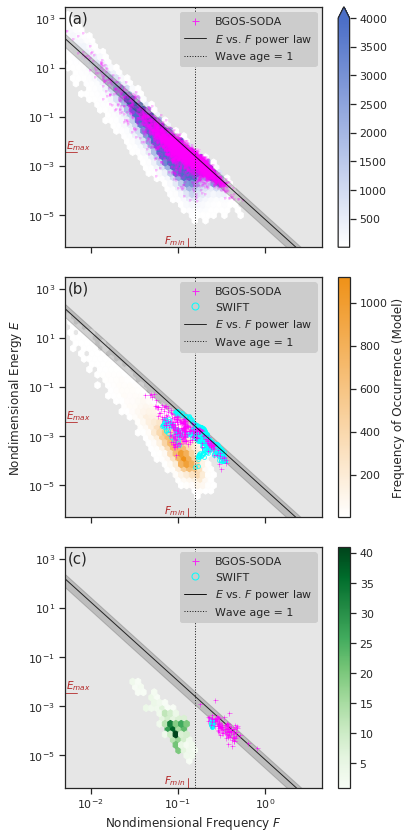

In [40]:
title = 'Open Water'
g=9.81

with sns.axes_style('ticks',rc={'axes.facecolor':'0.9'}):
    fig, ax = plt.subplots(3,1,figsize=(6,12),sharex=True,dpi=72) ## 300 for press quality
    
    ## aggregate model grid cells
    E_plot = spectra_nondim_openw_model.E.values
    E_plot = E_plot[~np.isnan(E_plot)]
    F_plot = spectra_nondim_openw_model.F.values
    F_plot = F_plot[~np.isnan(F_plot)]
    
    ## aggregate observations
    E_plot_obs = np.array([])
    F_plot_obs = np.array([])
    for key,ds in spectra_nondim_openw.items():
        if ('bgos' in key) | ('soda' in key):
            E_temp = ds.E.values
            E_temp = E_temp[~np.isnan(E_temp)]
            F_temp = ds.F.values
            F_temp = F_temp[~np.isnan(E_temp)]
            E_plot_obs = np.append(E_plot_obs,E_temp)
            F_plot_obs = np.append(F_plot_obs,F_temp)    
    
    plt.sca(ax[0])
    vmax = 4000
    hb = plt.hexbin(F_plot,E_plot,
               gridsize=50,
               cmap=blue_cmp,
               xscale='log',yscale='log',
               mincnt=1,#bins='log',
               alpha=1,vmax=vmax,
                extent=[-3.1,0,-6.5,5.5]
          )

    plt.colorbar(extend='max')#,label='Frequency of Occurrence')

    ## Obs scatter
    plt.plot(F_plot_obs,E_plot_obs,
             linestyle='',marker='+',markersize=3,alpha=0.60,mfc='magenta',
             mec='magenta',markeredgewidth=0.4)
    
    ## dummy for legend
    plt.plot(F_plot_obs[-1],E_plot_obs[-1]+1e9,
             linestyle='',marker='+',markersize=7,alpha=0.8,c='magenta',
             label='BGOS-SODA')

    ## Power law line
    plt.plot(F_lin,E,c='0',linewidth=1,alpha=0.8,label = '$E$ vs. $F$ power law')
    plt.fill_between(F_lin,E_l,E_u,alpha=0.2,color='0.1')

    plt.xlim(5*10**(-3),)
    plt.ylim(5*10**(-7),3*10**3)
    plt.text(10**(-2)*0.55,0.65*10**3,'(a)',fontsize='small')
    plt.minorticks_off()
    
    ## wave age and fully developed limit
    plt.axvline(0.13,0,1/25,c='firebrick',lw=0.8)
    plt.text(0.07,7*10**(-7),r'$F_{min}$',fontsize='xx-small',c='firebrick')
    
    plt.axhline(3.6e-3,0,1/20,c='firebrick',lw=0.8)
    plt.text(5.25*10**(-3),1.4*3.6e-3,r'$E_{max}$',fontsize='xx-small',c='firebrick')
    
    plt.axvline(1/2/np.pi,c='0.1',ls=':',lw=1,label='Wave age = 1')
    plt.legend(facecolor='0.8',framealpha=1)
    
    ########################
    plt.sca(ax[1])
    
    ## aggregate model grid cells
    E_plot = spectra_nondim_0to100_model.E.values
    E_plot = E_plot[~np.isnan(E_plot)]
    F_plot = spectra_nondim_0to100_model.F.values
    F_plot = F_plot[~np.isnan(F_plot)]
    
    ## aggregate observations
    E_plot_obs = np.array([])
    F_plot_obs = np.array([])
    for key,ds in spectra_nondim_0to100.items():
        if ('bgos' in key) | ('soda' in key):
            E_temp = ds.E.values
            E_temp = E_temp[~np.isnan(E_temp)]
            F_temp = ds.F.values
            F_temp = F_temp[~np.isnan(E_temp)]
            E_plot_obs = np.append(E_plot_obs,E_temp)
            F_plot_obs = np.append(F_plot_obs,F_temp)  
            
    E_plot_swift = np.array([])
    F_plot_swift = np.array([])
    for key,ds in spectra_nondim_0to100.items():
        if 'SWIFT' in key:
            E_temp = ds.E.values
            E_temp = E_temp[~np.isnan(E_temp)]
            F_temp = ds.F.values
            F_temp = F_temp[~np.isnan(E_temp)]
            E_plot_swift = np.append(E_plot_swift,E_temp)
            F_plot_swift = np.append(F_plot_swift,F_temp)  
    
    hb = plt.hexbin(F_plot,E_plot,
               gridsize=50,
               cmap=orange_cmp,
               xscale='log',yscale='log',
               mincnt=1,alpha=1,
               edgecolor='face',
               extent=[-3.1,0,-6.5,5.5]
          )

    plt.colorbar(label='Frequency of Occurrence (Model)')
            
    # SWIFT
    plt.plot(F_plot_swift,E_plot_swift,
             linestyle='',marker='o',markersize=4,alpha=0.7,mfc='none',mec='cyan')
    ## Obs
    plt.plot(F_plot_obs,E_plot_obs,
             linestyle='',marker='+',markersize=5,alpha=0.9,mfc='magenta',
             mec='magenta',markeredgewidth=0.5)

    ## dummy for legend
    plt.plot(F_plot_obs[-1],E_plot_obs[-1]+1e9,
             linestyle='',marker='+',markersize=7,alpha=0.8,c='magenta',
             label='BGOS-SODA')
    plt.plot(F_plot_swift[0],E_plot_swift[0]+1e8,
             linestyle='',marker='o',markersize=7,alpha=1,mfc='none',mec='cyan',
             label='SWIFT',zorder=5)
    
    ## Power law line
    plt.plot(F_lin,E,c='0',linewidth=1,alpha=0.8,label = '$E$ vs. $F$ power law')
    plt.fill_between(F_lin,E_l,E_u,alpha=0.2,color='0.1')


    plt.ylabel('Nondimensional Energy $E$')
    plt.xlim(5*10**(-3),)
    plt.ylim(5*10**(-7),3*10**3)
    
    plt.text(10**(-2)*0.55,0.65*10**3,'(b)',fontsize='small')
    plt.minorticks_off()
    
    ## wave age and fully developed limit
    plt.axvline(0.13,0,1/25,c='firebrick',lw=0.8)
    plt.text(0.07,7*10**(-7),r'$F_{min}$',fontsize='xx-small',c='firebrick')
    
    plt.axhline(3.6e-3,0,1/20,c='firebrick',lw=0.8)
    plt.text(5.25*10**(-3),1.4*3.6e-3,r'$E_{max}$',fontsize='xx-small',c='firebrick')
    
    
    plt.axvline(1/2/np.pi,c='0.1',ls=':',lw=1,label='Wave age = 1')
    
    plt.legend(facecolor='0.8',framealpha=1)
    
    
    ########################
    plt.sca(ax[2])
    
    ## aggregate model grid cells
    E_plot = spectra_nondim_100plus_model.E.values
    E_plot = E_plot[~np.isnan(E_plot)]
    F_plot = spectra_nondim_100plus_model.F.values
    F_plot = F_plot[~np.isnan(F_plot)]
    
    ## aggregate observations
    E_plot_obs = np.array([])
    F_plot_obs = np.array([])
    for key,ds in spectra_nondim_100plus.items():
        if ('bgos' in key) | ('soda' in key):
            E_temp = ds.E.values
            E_temp = E_temp[~np.isnan(E_temp)]
            F_temp = ds.F.values
            F_temp = F_temp[~np.isnan(E_temp)]
            E_plot_obs = np.append(E_plot_obs,E_temp)
            F_plot_obs = np.append(F_plot_obs,F_temp)
            
                
    E_plot_swift = np.array([])
    F_plot_swift = np.array([])
    for key,ds in spectra_nondim_100plus.items():
        ## only plot the two SWIFT buoys that are actually 100+ km
        ## this avoids the two other buoys that are misidentified as 100+ km
        ## based on findings in Rogers et al 2016 (rapid ice retreat during deployment)
        ## and only daily updating of the satellite data
        if ('SWIFT11_10Oct2015' in key) | ('SWIFT14_10Oct2015' in key):
            E_temp = ds.E.values
            E_temp = E_temp[~np.isnan(E_temp)]
            F_temp = ds.F.values
            F_temp = F_temp[~np.isnan(E_temp)]
            E_plot_swift = np.append(E_plot_swift,E_temp)
            F_plot_swift = np.append(F_plot_swift,F_temp) 

    plt.hexbin(F_plot,E_plot,
               gridsize=50,
               cmap='Greens',
               xscale='log',yscale='log',
               mincnt=1,#bins='log',
               alpha=1,#vmax=vmax,
               extent=[-3.1,0,-6.5,5.5]
          )
    
    plt.colorbar()
    
    ## Power law line
    plt.plot(F_lin,E,c='0',linewidth=1,alpha=0.8)#,label = '$E$ vs. $F$ power law')
    plt.fill_between(F_lin,E_l,E_u,alpha=0.2,color='0.1')
    
    ## Obs
    plt.plot(F_plot_swift,E_plot_swift,
             linestyle='',marker='o',markersize=4,alpha=0.9,mfc='none',mec='cyan')
    
    plt.plot(F_plot_obs,E_plot_obs,
             linestyle='',marker='+',markersize=5,alpha=0.90,mfc='magenta',
             mec='magenta',markeredgewidth=0.5)

    ## dummy for legend
    plt.plot(F_plot_obs[-1],E_plot_obs[-1]+1e9,
             linestyle='',marker='+',markersize=7,alpha=0.8,c='magenta',
             label='BGOS-SODA')
    
    plt.plot(F_plot_swift[0],E_plot_swift[0]+1e8,
             linestyle='',marker='o',markersize=7,alpha=1,mfc='none',mec='cyan',
             label='SWIFT',zorder=5)
    plt.plot(F_lin+1e6,E,c='0',linewidth=1,alpha=0.9,label = '$E$ vs. $F$ power law')
    
    plt.xlabel('Nondimensional Frequency $F$')#$F = U_{10}f_{p}(g)^{-1}$')
    plt.xlim(5*10**(-3),)
    plt.ylim(5*10**(-7),3*10**3)
    
    plt.text(10**(-2)*0.55,0.65*10**3,'(c)',fontsize='small')
    plt.minorticks_off()
    
    ## wave age and fully developed limit
    plt.axvline(0.13,0,1/25,c='firebrick',lw=0.8)
    plt.text(0.07,7*10**(-7),r'$F_{min}$',fontsize='xx-small',c='firebrick')
    
    plt.axhline(3.6e-3,0,1/20,c='firebrick',lw=0.8)
    plt.text(5.25*10**(-3),1.4*3.6e-3,r'$E_{max}$',fontsize='xx-small',c='firebrick')
    
    plt.axvline(1/2/np.pi,c='0.1',ls=':',lw=1,label='Wave age = 1')
    
    plt.legend(facecolor='0.8',framealpha=1)

    
    plt.tight_layout()
    plt.show()

## Figure: Implied Fetch

Calculate the implied fetch only for the observations that are within the uncertainty bounds of the wind wave power law.

In [41]:
######### 0 to 100 km ##########
E_plot_obs = np.array([])
F_plot_obs = np.array([])
u10_obs = np.array([])
for key,ds in spectra_nondim_0to100.items():
    if ('bgos' in key) | ('soda' in key):
        E_temp = ds.E.values
        E_temp = E_temp[~np.isnan(E_temp)]
        F_temp = ds.F.values
        F_temp = F_temp[~np.isnan(E_temp)]
        u10_temp = ds.wind.values
        u10_temp = u10_temp[~np.isnan(u10_temp)]
        E_plot_obs = np.append(E_plot_obs,E_temp)
        F_plot_obs = np.append(F_plot_obs,F_temp)
        u10_obs = np.append(u10_obs,u10_temp)
        
## calculate E_hat, the predicted E from E vs. F scaling
## then will check whether E_obs is within uncertainty for E_hat
# Ehat = C0 * F_plot_obs**C1
E_uhat = (C0+uC0) * F_plot_obs**C1
E_lhat = (C0-uC0) * F_plot_obs**C1

## subset E, F, wind for just the wind waves
E_select_obs = E_plot_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]
F_select_obs = F_plot_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]
u10_select_obs = u10_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]

Xfetch = (F_select_obs / B)**(1/b)
## restore dimensions
fetch_0to100 = Xfetch * u10_select_obs**2 / g / 1000
u10_0to100 = u10_select_obs

######### repeat for 100+ km #########
E_plot_obs = np.array([])
F_plot_obs = np.array([])
u10_obs = np.array([])
for key,ds in spectra_nondim_100plus.items():
    if ('bgos' in key) | ('soda' in key):
        E_temp = ds.E.values
        E_temp = E_temp[~np.isnan(E_temp)]
        F_temp = ds.F.values
        F_temp = F_temp[~np.isnan(E_temp)]
        u10_temp = ds.wind.values
        u10_temp = u10_temp[~np.isnan(u10_temp)]
        E_plot_obs = np.append(E_plot_obs,E_temp)
        F_plot_obs = np.append(F_plot_obs,F_temp)
        u10_obs = np.append(u10_obs,u10_temp)
        
## calculate E_hat, the predicted E from E vs. F scaling
## then will check whether E_obs is within uncertainty for E_hat
# Ehat = C0 * F_plot_obs**C1
E_uhat = (C0+uC0) * F_plot_obs**C1
E_lhat = (C0-uC0) * F_plot_obs**C1

## subset E, F, wind for just the wind waves
E_select_obs = E_plot_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]
F_select_obs = F_plot_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]
u10_select_obs = u10_obs[(E_plot_obs > E_lhat) & 
                          (E_plot_obs < E_uhat)]

Xfetch = (F_select_obs / B)**(1/b)
## restore dimensions
fetch_100plus = Xfetch * u10_select_obs**2 / g / 1000
u10_100plus = u10_select_obs

In [42]:
## get approximate side lengths of model grid cells
gridlengths = (ww_dict['ww2012'].tarea * ww_dict['ww2012'].mask).values
gridlengths = gridlengths[gridlengths > 0] ** (0.5) / 1000 ## m to km

/glade/u/home/vcooper/miniconda3/envs/camus/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until


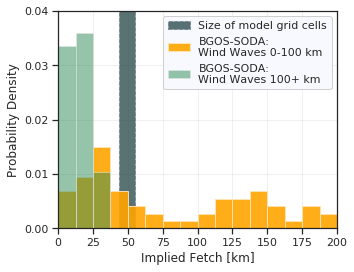

In [43]:
## plot implied Fetch
with sns.axes_style('ticks'):
    fig,ax = plt.subplots(figsize=(5,4),dpi=72)
    
    plt.axvspan(np.nanmin(gridlengths),
                np.nanmax(gridlengths),
                alpha=0.8,facecolor='darkslategray',edgecolor='slategray',ls='--',
                label='Size of model grid cells')
    
    plt.hist(fetch_0to100[fetch_0to100 < 200],density=True,
             bins=np.linspace(0,200,17),
             label='BGOS-SODA:\n'+'Wind Waves 0-100 km',
             color='orange',edgecolor='moccasin',
             alpha=0.9)

    plt.hist(fetch_100plus[fetch_100plus < 200],density=True,
             bins=np.linspace(0,200,17),
             label='BGOS-SODA:\n'+'Wind Waves 100+ km',
             color='seagreen',edgecolor='0.9',
             alpha=0.5)

    ax.grid(True,alpha=0.3)
    plt.legend(loc='upper right',framealpha=0.9,facecolor='ghostwhite')
    plt.xlim(0,200)
    plt.xlabel('Implied Fetch [km]')
    plt.ylabel('Probability Density')
    plt.yticks(ticks=[0,0.01,0.02,0.03,0.04])

    plt.show()

# Figure: Ice Concentration Bias

Satellite and model ice concentrations at 100+ km

In [44]:
### month toggle ###
## growth season
# monmin = 9
# monmax = 12

## melt season
monmin = 5
monmax = 9
####################

## aggregate satellite obs
# concentration
tempice = boot.aice_d.sel(time=slice('2012-01-01','2019-12-31'))
tempice = tempice.where(
    (tempice.time.dt.month > monmin) & (tempice.time.dt.month < monmax), drop=True)
temp = tempice.sel(nj=latslice).where(beau_mask > 0, drop=True)

# distance
tempice = dist_sat_all.cdr.sel(time=slice('2012-01-01','2019-12-31'))
tempice = tempice.where(
    (tempice.time.dt.month > monmin) & (tempice.time.dt.month < monmax), drop=True)
dist_temp = tempice.where(beau_mask > 0, drop=True)

temp_obs = temp.where(dist_temp > 100) # over 100

## model aggregate
# concentration
tempice = ww_allbeau.ice # already limited to 2012 to 2019
tempice = tempice.where(
    (tempice.time.dt.month > monmin) & (tempice.time.dt.month < monmax), drop=True)
temp = tempice # already limited to beaufort region

# distance
tempice = ww_allbeau.dist 
tempice = tempice.where(
    (tempice.time.dt.month > monmin) & (tempice.time.dt.month < monmax), drop=True)
dist_temp = tempice # already limited to beaufort region

temp_model = temp.where(dist_temp > 100)

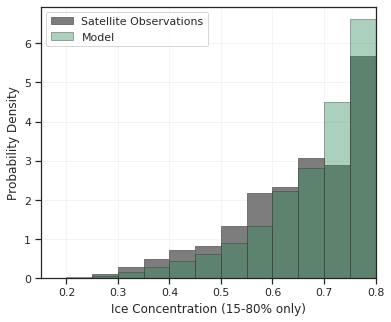

In [45]:
## plot figure
with sns.axes_style('ticks'):
    fig,ax = plt.subplots(figsize=(6,5),dpi=72)
    temp_obs.plot(bins=np.arange(15,81,5)/100,density=True,
                  alpha=0.85,
                  color='0.4',
                  edgecolor='0.4',
                  label='Satellite Observations')
    temp_model.plot(bins=np.arange(15,81,5)/100,density=True,
                    alpha=0.4,
                    color='seagreen',
                    edgecolor='0.2',
                    label='Model')
    
    plt.xlim(0.15,0.80)
    plt.title('')
    plt.xlabel('Ice Concentration (15-80% only)')
    plt.ylabel('Probability Density')
    ax.grid(True,alpha=0.2)
    plt.legend()
    plt.show()

# Figure: Floe Fracture Histogram

First, identify spectra from model to use for floe fracture.

In [46]:
over100_hs = over100_spectra.integrate(dim='f')
hs_sort = (over100_hs.sortby(over100_hs))**(1/2)*4

## sort spectra by Hs
over100_spectra_sorted = over100_spectra.sortby(over100_spectra.integrate(dim='f'))

## get median, 50th percentile, 75th percentile, 90th percentile, Max
nspec = len(over100_spectra_sorted.celltime)
indexlist = [int(nspec*0.5), int(nspec*0.75), int(nspec*0.9), -1]

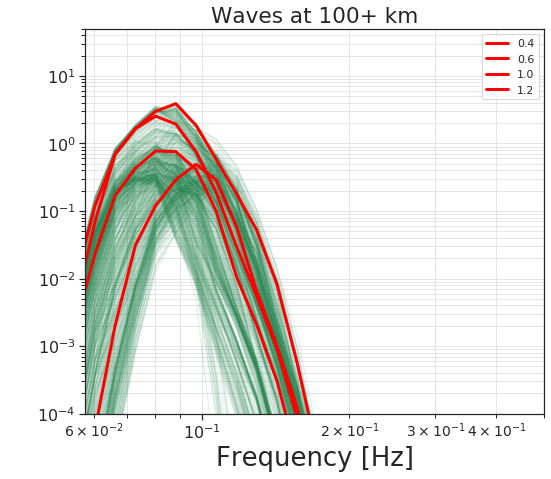

In [47]:
## plot with highlighted waves

title = '100+ km Inside MIZ'

distmin=100
distmax=1e9

with sns.axes_style('white'):
    minorticks()
    fig,ax = plt.subplots(figsize=(8,7))
    
    over100_spectra.plot.line(
        hue='celltime',alpha=0.110,add_legend=False,
        xscale='log',yscale='log',
        c='seagreen')
    
    [over100_spectra_sorted[:,i].plot(
        xscale='log',yscale='log',lw=3,c='r',label=np.round(hs_sort[i].values,1)) for i in indexlist]
    plt.legend()
    
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.tick_params(axis='both', which='minor', labelsize=14)
    
    ax.grid(True,which='both',alpha=0.5)
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    plt.xlabel('Frequency [Hz]',fontsize='x-large')

    plt.title('Waves at 100+ km',fontsize='large')
    plt.ylabel(' ',fontsize='x-large')

    plt.tight_layout()
    plt.show()

Now identify the BGOS-SODA spectra for floe fracture.

10
3
19
68
4


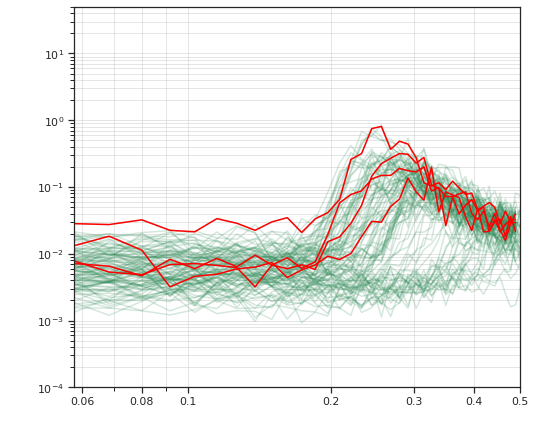

In [48]:
title = '100+ km inside MIZ'
distmin = 100
distmax = 1e5

## create storage for Hs to aggregate obs
hs_oblist = np.array([])
ind_oblist = np.array([])
name_oblist = np.array([])


with sns.axes_style('white'):
    minorticks()
    fig,ax = plt.subplots(figsize=(8,7))
    
    for key,val in insitu_dict.items():
        if (key[0:5] != 'SWIFT'):
            spectrum = val.wavespectra_energy.where(
                        (val.cdr > distmin) & 
                        (val.cdr < distmax) & 
                        (val.sigwaveheight > setmin))

            spectrum.plot.line(
                        hue='time',alpha=0.2,add_legend=False,c='seagreen')
            print(spectrum.where(
                spectrum.max(dim='freq_wavespectra') > 0,drop=True).time.values.size)
            hs_oblist = np.append(
                hs_oblist,val.sigwaveheight[~np.isnan(spectrum.max(axis=1))].values)
            ind_oblist = np.append(
                ind_oblist,np.where(~np.isnan(spectrum.max(axis=1)))[0])
            name_oblist = np.append(
                name_oblist,np.tile(key,len(np.where(~np.isnan(spectrum.max(axis=1)))[0])))

    ## sort obs and get desired percentiles
    percentile = [50,75,90,100]

    sorted_ind = np.argsort(hs_oblist)
    hs_oblist_sort = hs_oblist[sorted_ind]
    ind_oblist_sort = ind_oblist[sorted_ind]
    name_oblist_sort = name_oblist[sorted_ind]

    nspec_obs = len(hs_oblist_sort)
    indexlist_obs = [int(nspec_obs*0.5), int(nspec_obs*0.75), int(nspec_obs*0.9), -1]

    ## make them into a dictionary for combining
    windwave_obdict = {}
    for i,pp in enumerate(percentile):
        tempds = insitu_dict[name_oblist_sort[
            indexlist_obs[i]]][['sigwaveheight','wind','cdr','wavespectra_energy']].isel(
            time=int(ind_oblist_sort[indexlist_obs[i]]))

        tempds['percentile'] = pp
        tempds['dataset'] = name_oblist_sort[indexlist_obs[i]]
        tempds = tempds.set_coords(['percentile','dataset'])
        tempds.wavespectra_energy.plot(c='r')
        windwave_obdict[pp] = tempds
    
    ## plot with selected spectra highlighted
    ax.grid(True,which='both',alpha=0.5)
    plt.loglog()
    plt.xlim(10**(-1.24),10**(-0.3))
    plt.ylim(10**(-4),5*10**(1))
    plt.title('BGOS + SODA: Wave Spectral Density\n' + title)
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Energy [$m^2 Hz^{-1}$]')#,fontsize='x-large')
    plt.ylabel(' ',fontsize='x-large')
    plt.xlabel(' ',fontsize='x-large')
    plt.title('')

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str))

    plt.show()

## temporary storage for selected obs spectra
## bgos and soda have different dimensions for freq
## turns out BGOS spectra are only ones used
tempds_bgos = xr.concat(windwave_obdict.values(),dim='percentile')

In [49]:
## prep spectra for saving
swell_send = over100_spectra_sorted[:,indexlist].assign_coords(
    {'celltime':percentile}).rename({'celltime':'percentile'})
swell_send['percentile'] = swell_send.percentile.assign_attrs({'Comment':'% ranking by H_s'})

windwave_send = tempds_bgos.drop(['TLON','TLAT'])

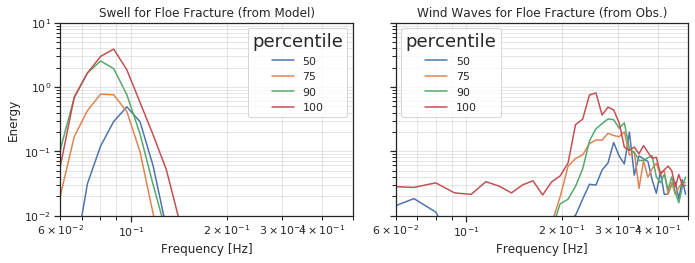

In [50]:
with sns.axes_style('ticks'):
    fig,axs = plt.subplots(1,2,sharey=True,figsize=(10,4))
    
    swell_send[:,:].plot.line(hue='percentile',ax=axs[0])
    
    ## noise floor
    x = np.append([windwave_send.freq_wavespectra.values],0.5)
    nx = x.size
    yupper = np.tile(1*10**(-2),nx)
    ylower = np.tile(9*10**(-5),nx)
    axs[0].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')

    axs[0].loglog()
    axs[0].set_xlim(0.06,0.5)
    axs[0].set_ylim(10**(-2),10)
    axs[0].set_ylabel('Energy')
    axs[0].set_xlabel('Frequency [Hz]')
    axs[0].grid(True,which='both',alpha=0.5)
    axs[0].set_title('Swell for Floe Fracture (from Model)')

    ## wind wave
    windwave_send.wavespectra_energy.plot.line(hue='percentile',ax=axs[1])
    axs[1].fill_between(x,ylower,yupper,alpha=0.1,color='0.1')
    
    axs[1].loglog()
    axs[1].set_xlim(0.06,0.5)
    axs[1].set_ylabel('')
    axs[1].set_ylim(10**(-2),10)
    axs[1].set_xlabel('Frequency [Hz]')
    axs[1].grid(True,which='both',alpha=0.5)
    axs[1].set_title('Wind Waves for Floe Fracture (from Obs.)')
    plt.tight_layout()
    plt.show()

In [51]:
## save swell
# new_filename = '/glade/campaign/univ/uwas0070/vcooper/waveice/filesharing/model_swell_over100_spectra_v02.nc'
# print ('saving to ', new_filename)
# swell_send.to_netcdf(path=new_filename)
# print ('finished saving')

## save wind wave
# new_filename = '/glade/campaign/univ/uwas0070/vcooper/waveice/filesharing/obs_windwave_over100_spectra_v03.nc'
# print ('saving to ', new_filename)
# windwave_send.to_netcdf(path=new_filename)
# print ('finished saving')

Load saved data and plot floe fracture results from LAR using Horvat & Tziperman (2015)

In [52]:
frachist = xr.open_dataset(
    '/glade/u/home/lettier/analysis/analysis_wave-ice/for-vince/frachist_from_ht15_model_obs_spectra_v2.nc')

## add H_s
frachist['hs'] = 4*(frachist.spectrum.integrate(dim='freq'))**(1/2)

In [53]:
## floe-size bin centers
print(np.round(frachist.nk.values))

[  3.  10.  22.  41.  70. 114. 176. 260. 370. 506. 668. 850.]


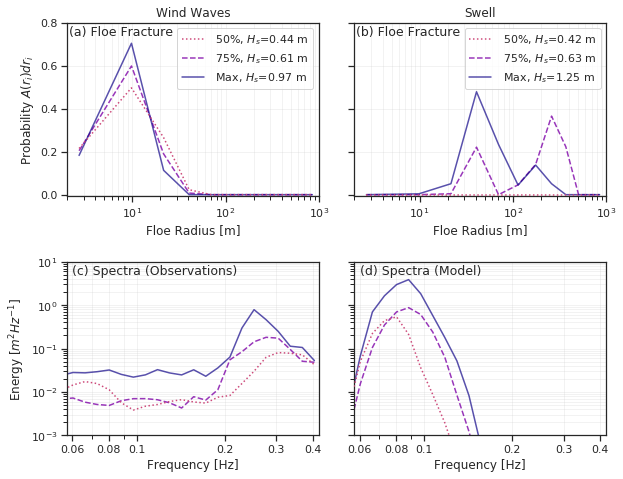

In [54]:
## plot floe fracture

cmap_1 = mpl.cm.get_cmap('plasma')(0.5)
cmap_2 = mpl.cm.get_cmap('plasma')(0.25)
cmap_3 = mpl.cm.get_cmap('plasma')(0.01)

cmapb = 'plasma'
cmap_1b = mpl.cm.get_cmap(cmapb)(0.5)
cmap_2b = mpl.cm.get_cmap(cmapb)(0.25)
cmap_3b = mpl.cm.get_cmap(cmapb)(0.01)


with sns.axes_style('ticks'):
    fig,axs = plt.subplots(2,2,figsize=(9,7),dpi=72,sharey='row')
    
    ## obs spectra
    n = 4
    colors = plt.cm.BuGn(np.linspace(0.5,.95,n))
    
    i = 0
    frachist.frachist[i].plot(lw=1.5,alpha=0.99,ax=axs[0,0],c=cmap_1,ls=':',
                               label=' ' + '50%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m',zorder=5)
    i = 1
    frachist.frachist[i].plot(lw=1.51,alpha=0.8,ax=axs[0,0],c=cmap_2,ls='--',
                               label=' ' + '75%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')
    i = 3
    frachist.frachist[i].plot(lw=1.52,alpha=0.7,ax=axs[0,0],c=cmap_3,ls='-',
                               label=' ' + 'Max, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')

    axs[0,0].grid(True,which='both',alpha=0.5,lw=0.5)
    axs[0,0].set_ylabel('Probability $A(r_i)dr_i$')
    axs[0,0].set_xlabel('Floe Radius [m]')
    axs[0,0].legend()
    axs[0,0].set_title('Wind Waves')
    axs[0,0].text(2.1,0.74,'(a) Floe Fracture',fontsize='x-small')
    axs[0,0].set_xlim(2,10**3)
    axs[0,0].set_ylim(-.007,0.8)
    axs[0,0].semilogx()
    
    
    n = 4
    colors = plt.cm.BuGn(np.linspace(0.5,.95,n))
    
    i = 0
    frachist.frachist[4:][i+1].plot(lw=1.5,alpha=0.99,ax=axs[0,1],ls=':',c=cmap_1b,
                               label=' ' + '50%, $H_s$=' + 
                               str(np.round(frachist.hs[4:][i+1].values,2)) + ' m',zorder=5)
    i = 1
    frachist.frachist[4:][i+1].plot(lw=1.51,alpha=0.8,ax=axs[0,1],ls='--',c=cmap_2b,
                               label=' ' + '75%, $H_s$=' + 
                               str(np.round(frachist.hs[4:][i+1].values,2)) + ' m')
    i = 2 
    frachist.frachist[4:][i+1].plot(lw=1.52,alpha=0.7,ax=axs[0,1],c=cmap_3b,
                               label=' ' + 'Max, $H_s$=' + 
                               str(np.round(frachist.hs[4:][i+1].values,2)) + ' m')
    

    axs[0,1].grid(True,which='both',alpha=0.5,lw=0.5)

    axs[0,1].set_xlabel('Floe Radius [m]')
    axs[0,1].set_ylabel('')
    axs[0,1].legend()
    axs[0,1].set_title('Swell')
    axs[0,1].text(2.1,0.74,'(b) Floe Fracture',fontsize='x-small')
    axs[0,1].set_xlim(2,10**3)
    axs[0,1].semilogx()
    
    ## SPECTRA ##
    plt.sca(axs[1,0])
    
    i = 0
    frachist.spectrum[i].plot(lw=1.5,alpha=0.99,ax=axs[1,0],c=cmap_1,ls=':',
                               label=' ' + '50%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m',zorder=5)
    i = 1
    frachist.spectrum[i].plot(lw=1.51,alpha=0.8,ax=axs[1,0],c=cmap_2,ls='--',
                               label=' ' + '75%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')
    i = 3
    frachist.spectrum[i].plot(lw=1.52,alpha=0.7,ax=axs[1,0],c=cmap_3,ls='-',
                               label=' ' + 'Max, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')
    

    axs[1,0].tick_params(axis='both', which='major')
    axs[1,0].tick_params(axis='both', which='minor')
    
    axs[1,0].grid(True,which='both',alpha=0.5,lw=0.5)
    axs[1,0].loglog()
    axs[1,0].set_ylim(10**(-4),5*10**(1))
    axs[1,0].set_xlabel('Frequency [Hz]')
    axs[1,0].set_ylabel('Energy [$m^2 Hz^{-1}$]')
    axs[1,0].set_title('')
    axs[1,0].text(0.06,5,'(c) Spectra (Observations)',fontsize='x-small')

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str))
    axs[1,0].set_xlim(10**(-1.24),0.42)
#     axs[1,0].legend()
    
    ###
    plt.sca(axs[1,1])
    ## indexing is not a mistake; original swell spectra were slightly off percentiles bc hsmin was
    ## originally 0.2 m rather than 0.3 m; however, the H_s values of the spectra sent with hsmin=0.2m 
    ## are within 4 cm of the spectra when Hs=0.3m if using different percentiles, so these are 
    ## approximately the same. Ask me for details if curious.
    
    i = 1
    frachist.spectrum[4:][i].plot(lw=1.5,alpha=0.99,ax=axs[1,1],c=cmap_1b,ls=':',
                               label=' ' + '50%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m',zorder=5)
    i = 2
    frachist.spectrum[4:][i].plot(lw=1.51,alpha=0.8,ax=axs[1,1],c=cmap_2b,ls='--',
                               label=' ' + '75%, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')
    i = 3
    frachist.spectrum[4:][i].plot(lw=1.52,alpha=0.7,ax=axs[1,1],c=cmap_3b,ls='-',
                               label=' ' + 'Max, $H_s$=' + 
                               str(np.round(frachist.hs[i].values,2)) + ' m')

    axs[1,1].tick_params(axis='both', which='major')
    axs[1,1].tick_params(axis='both', which='minor')
    
    axs[1,1].grid(True,which='both',alpha=0.5,lw=0.5)
    axs[1,1].loglog()

    axs[1,1].set_ylim(10**(-3),10**(1))
    axs[1,1].set_xlabel('Frequency [Hz]')
    axs[1,1].set_ylabel('')
    axs[1,1].set_title('')
    axs[1,1].text(0.06,5,'(d) Spectra (Model)',fontsize='x-small')

    xticklab = np.round(np.append([0.06,0.08],np.arange(0.1,0.51,0.1)),2)
    plt.xticks(ticks=xticklab,labels=xticklab.astype(str))
    axs[1,1].set_xlim(10**(-1.24),0.42)
    
    
    plt.tight_layout()
    plt.show()

obs_spectra_1 0.44 0.712
obs_spectra_2 0.61 0.803
obs_spectra_3 0.68 0.854
obs_spectra_4 0.97 0.887
model_spectra_1 0.29 0.0
model_spectra_2 0.42 0.0
model_spectra_3 0.63 0.0
model_spectra_4 1.25 0.004


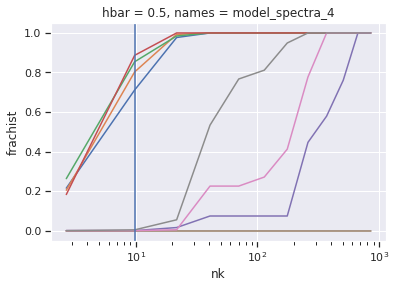

In [55]:
## supporting calc for ice area reduced to floe radius less than 15 m
## based on Steele (1992)

## BASED on radius_lims, the first two categories are always less than 15 m radius
[print(frachist.names[i].values, np.round(frachist.hs[i].values,2),
       np.round(frachist.frachist[i].cumsum().values[1],3)) for i in range(len(frachist.names))]
[frachist.frachist[i].cumsum().plot() for i in range(len(frachist.names))]
plt.axvline(frachist.nk.values[1])
plt.semilogx()
plt.show()

In [56]:
## additional info: New Ice Formation
## Shen et al [2001] via. Roach et al (2019) equation (1)

g = 9.81 #m/s2
C2 = 0.167 # kg m-1 s-2
rho_i = 900 # kg / m3, assumption from http://pubs.aina.ucalgary.ca/arctic/Arctic11-3-134.pdf
print('New ice growth for swell in ice')
print('Dmax Lambda F_p H_s')
for i,pp in enumerate(percentile):
    temp_fp = swell_send.f[swell_send.sel(percentile=pp).argmax()]
    temp_lambp = g/(2 * np.pi * temp_fp**2)
    Wa = hs_sort[indexlist[i]].values / 2 # wave amplitude is Hs/2 per Roach 2019
    Dmax = np.sqrt(2*C2*temp_lambp**2 / (np.pi**3 * g * rho_i * Wa))

    print(np.round(Dmax.values,2), np.round(temp_lambp.values,1), np.round(temp_fp.values,3), np.round(Wa*2,2))

New ice growth for swell in ice
Dmax Lambda F_p H_s
0.39 165.6 0.097 0.44
0.49 242.4 0.08 0.59
0.38 242.4 0.08 0.99
0.28 200.4 0.088 1.25


# Supplemental Figure: Wave Occurrence by Month

In [57]:
## function to aggregate BGOS-SODA obs months

def hist_by_mon(distmin,distmax):

    setmin = 0.3
    mlist = np.array([])
    obstring = 'bgosA'
    obsel = insitu_dict[obstring]
    tempob = obsel.sigwaveheight.where(
        (obsel.cdr > distmin) & (obsel.cdr < distmax) &
        (obsel.sigwaveheight > setmin),drop=True)
    mlist = np.append(mlist,tempob.time.dt.month.values)

    obstring = 'bgosD'
    obsel = insitu_dict[obstring]
    tempob = obsel.sigwaveheight.where(
        (obsel.cdr > distmin) & (obsel.cdr < distmax) &
        (obsel.sigwaveheight > setmin),drop=True)

    mlist = np.append(mlist,tempob.time.dt.month.values)
    mlist

    slist = np.array([])
    obstring = 'sodaA'
    obsel = insitu_dict[obstring]
    tempob = obsel.sigwaveheight.where(
        (obsel.cdr > distmin) & (obsel.cdr < distmax) &
        (obsel.sigwaveheight > setmin),drop=True)

    slist = np.append(slist,tempob.time.dt.month.values)

    obstring = 'sodaB'
    obsel = insitu_dict[obstring]
    tempob = obsel.sigwaveheight.where(
        (obsel.cdr > distmin) & (obsel.cdr < distmax) &
        (obsel.sigwaveheight > setmin),drop=True)

    slist = np.append(slist,tempob.time.dt.month.values)

    obstring = 'sodaC'
    obsel = insitu_dict[obstring]
    tempob = obsel.sigwaveheight.where(
        (obsel.cdr > distmin) & (obsel.cdr < distmax) &
        (obsel.sigwaveheight > setmin),drop=True)

    slist = np.append(slist,tempob.time.dt.month.values)

    print((mlist/mlist).sum() + (slist/slist).sum())
    return(mlist,slist)

In [58]:
mlist_openw, slist_openw = hist_by_mon(-1,0.00001)
mlist0to100, slist0to100 = hist_by_mon(0,100)
mlist, slist = hist_by_mon(100,1e8)

8070.0
247.0
104.0


In [59]:
## model from 2012-2019 in region
hs_reduce = ww_allbeau.hs
dist_reduce = ww_allbeau.dist

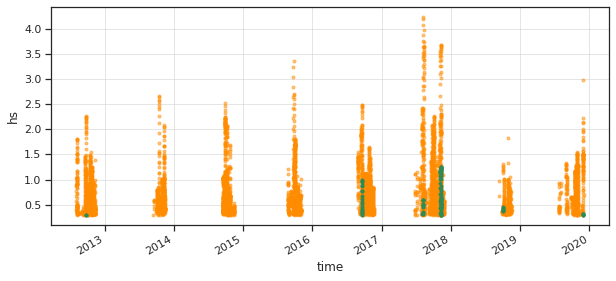

In [62]:
## quick plot of timeline for when waves occur in ice
with sns.axes_style('ticks'):
    plt.figure(figsize=(10,4))
    hs_reduce.where((dist_reduce > 0) & (dist_reduce < 100) & (hs_reduce > 0.3),drop=True).max(dim=('nj','ni')).plot(
        ls='',marker='.',c='darkorange',alpha=0.5)
    hs_reduce.where((dist_reduce > 100) & (hs_reduce > 0.3),drop=True).max(dim=('nj','ni')).plot(
        ls='',marker='.',c='seagreen')
    plt.grid(alpha=0.5)
    plt.show()

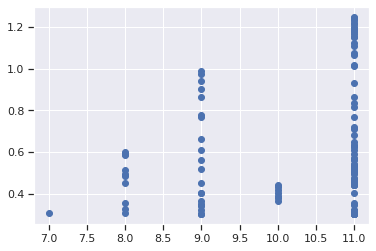

In [64]:
## quick plot by month
plt.plot(hs_reduce.where((dist_reduce > 100) & (hs_reduce > 0.3),drop=True).max(dim=('nj','ni')).time.dt.month,
         hs_reduce.where((dist_reduce > 100) & (hs_reduce > 0.3),drop=True).max(dim=('nj','ni')),marker='o',ls='')
plt.show()

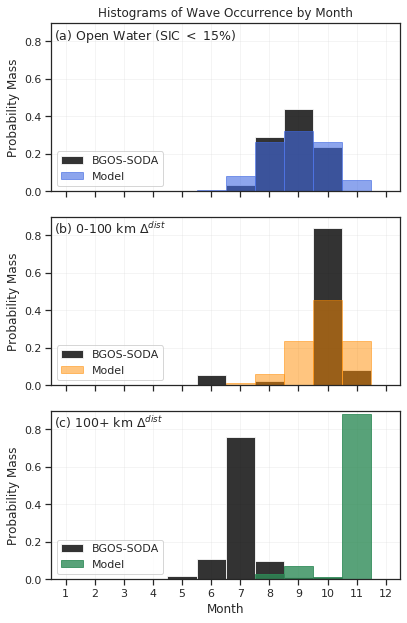

In [65]:
with sns.axes_style('ticks'):
    fig,axs = plt.subplots(3,1,figsize=(6,9),dpi=72,sharex=True,sharey=True)
    
    plt.sca(axs[0])
    #moorings
    plt.hist(np.append(mlist_openw,slist_openw),bins=12,range=[0.5,12.5],edgecolor='w',
             color='k',alpha=0.8,label='BGOS-SODA',density=True)
    
    #model
    distmin = -1
    distmax = 0.001
    
    
    temp = xr.where((dist_reduce > distmin) & 
            (dist_reduce < distmax) & 
            (hs_reduce > setmin),1,0)
    temp2 = temp.where(temp > 0,drop=True).stack(cell=('nj','ni','time'))
    temp2.where(temp2>0,drop=True).time.dt.month.plot.hist(color='royalblue',alpha=0.6,
                                                           bins=12,range=[0.5,12.5],edgecolor='royalblue',
                                                          label='Model',density=True)


    plt.xticks(ticks=np.arange(12)+1)
    plt.xlim(0.5,12.5)
    plt.ylabel('Probability Mass')
    plt.xlabel('')
    plt.text(0.6,0.81,'(a) Open Water (SIC $<$ 15%)',fontsize='x-small')
    plt.grid(alpha=0.2)
    plt.legend(loc='lower left')
    plt.title('Histograms of Wave Occurrence by Month')

    plt.sca(axs[1])
    #moorings
    plt.hist(np.append(mlist0to100,slist0to100),bins=12,range=[0.5,12.5],edgecolor='w',
             color='k',alpha=0.8,label='BGOS-SODA',density=True)
    
    #model
    distmin = 0
    distmax = 100
    
    
    temp = xr.where((dist_reduce > distmin) & 
            (dist_reduce < distmax) & 
            (hs_reduce > setmin),1,0)
    temp2 = temp.where(temp > 0,drop=True).stack(cell=('nj','ni','time'))
    temp2.where(temp2>0,drop=True).time.dt.month.plot.hist(color='darkorange',alpha=0.5,
                                                           bins=12,range=[0.5,12.5],edgecolor='darkorange',
                                                          label='Model',density=True)

    plt.xticks(ticks=np.arange(12)+1)
    plt.xlim(0.5,12.5)
    plt.ylim(0,0.9)
    plt.ylabel('Probability Mass')
    plt.xlabel('')
    plt.text(0.6,0.81,'(b) 0-100 km $\Delta^{dist}$',fontsize='x-small')
    plt.grid(alpha=0.2)
    plt.title('')
    plt.legend(loc='lower left')
    
    plt.sca(axs[2])
    #model
    distmin = 100
    distmax = 1e9
    
    #moorings
    plt.hist(np.append(mlist,slist),bins=12,range=[0.5,12.5],
             color='k',alpha=0.8,label='BGOS-SODA',density=True)
    
    temp = xr.where((dist_reduce > distmin) & 
            (dist_reduce < distmax) & 
            (hs_reduce > setmin),1,0)
    temp2 = temp.where(temp > 0,drop=True).stack(cell=('nj','ni','time'))
    temp2.where(temp2>0,drop=True).time.dt.month.plot.hist(color='seagreen',alpha=0.8,
                                                           bins=12,range=[0.5,12.5],edgecolor='seagreen',
                                                          label='Model',density=True)


    plt.xticks(ticks=np.arange(12)+1)
    plt.xlim(0.5,12.5)
    plt.ylabel('Probability Mass')
    plt.xlabel('Month')
    plt.text(0.6,0.81,'(c) 100+ km $\Delta^{dist}$',fontsize='x-small')
    plt.title('')
    plt.grid(alpha=0.2)
    plt.legend(loc='lower left')
    
    plt.tight_layout()
    plt.show()

# Supplemental Figure: Wave Attenuation

In [66]:
## this function returns log10alpha, copied from w3sic4md.F90
def log_alpha(x1,x2,x3):
    x1sqr = x1*x1 # period, range 2 to 24.3 s
    x2sqr = x2*x2 # radius, range 2.5 to 100 m
    x3sqr = x3*x3 # thickness, range 0.1 to 3.5 m
    log10a = (-0.26982 + 1.5043*x3 - 0.70112*x3sqr + 0.011037*x2 + 
            -0.0073178*x2*x3 + 0.00036604*x2*x3sqr + 
            -0.00045789*x2sqr + 1.8034e-05*x2sqr*x3 + 
            -0.7246*x1 + 0.12068*x1*x3 + 
            -0.0051311*x1*x3sqr + 0.0059241*x1*x2 + 
             0.00010771*x1*x2*x3 - 1.0171e-05*x1*x2sqr + 
             0.0035412*x1sqr - 0.0031893*x1sqr*x3 + 
            -0.00010791*x1sqr*x2 + 
             0.00031073*x1**3 + 1.5996e-06*x2**3 + 0.090994*x3**3)
    return(log10a)


def log_alpha_adj(x1,x2,x3): ## this also includes supplemental T2 T4 term
    x1sqr = x1*x1 # period, range 2 to 24.3 s
    x2sqr = x2*x2 # radius, range 2.5 to 100 m
    x3sqr = x3*x3 # thickness, range 0.1 to 3.5 m
    log10a = (-0.26982 + 1.5043*x3 - 0.70112*x3sqr + 0.011037*x2 + 
            -0.0073178*x2*x3 + 0.00036604*x2*x3sqr + 
            -0.00045789*x2sqr + 1.8034e-05*x2sqr*x3 + 
            -0.7246*x1 + 0.12068*x1*x3 + 
            -0.0051311*x1*x3sqr + 0.0059241*x1*x2 + 
             0.00010771*x1*x2*x3 - 1.0171e-05*x1*x2sqr + 
             0.0035412*x1sqr - 0.0031893*x1sqr*x3 + 
            -0.00010791*x1sqr*x2 + 
             0.00031073*x1**3 + 1.5996e-06*x2**3 + 0.090994*x3**3)
    ## long period
    c1 = 2.12e-3
    c2 = 4.59e-2
    a_long = c1/x1sqr + c2/x1**4
  
    log10a = np.where((x1 > 5) & (x1 <= 20), np.log10(10**log10a + a_long), log10a)
    log10a = np.where(x1 > 20, np.log10(a_long), log10a)

    return(log10a)

  ## label format
def fmt(x):
    s = f"{x:.1f}"
    if s.endswith("0"):
        s = f"{x:.0f}"
    return rf"{s}" if plt.rcParams["text.usetex"] else f"{s}"

In [67]:
import scipy.io as sio
matfile = '/glade/u/home/vcooper/analysis/waveice/attenuation_table_finer.mat'
table = sio.loadmat(matfile)
del table['__header__']
del table['__version__']
del table['__globals__']

In [68]:
print(table['floe_thickness'], table['floe_thickness'].shape)
print(table['radius'], table['radius'].shape)
print(table['period'], table['period'].shape)

[[0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9  1.   1.5  1.75 2.   2.25 2.5
  2.75 3.   3.25 3.5 ]] (1, 18)
[[  2.6   3.    5.   10.   20.   30.   40.   50.   60.   70.   80.   90.
  100.  200. ]] (1, 14)
[[ 2.3   2.45  2.6   2.75  2.9   3.05  3.2   3.35  3.5   3.65  3.8   3.95
   4.1   4.25  4.4   4.75  5.    5.25  5.5   5.75  6.    6.25  6.5   6.75
   7.    7.75  8.5   9.25 10.   10.75 11.5  12.25 13.   13.75 14.5  15.25
  16.   16.75 17.5  18.25 19.   19.75 20.5  21.25 22.   22.75 23.5  24.25
  25.  ]] (1, 49)


5.0
20.0
100.0
3.95
8.5
16.0
0.3
1.0
3.0


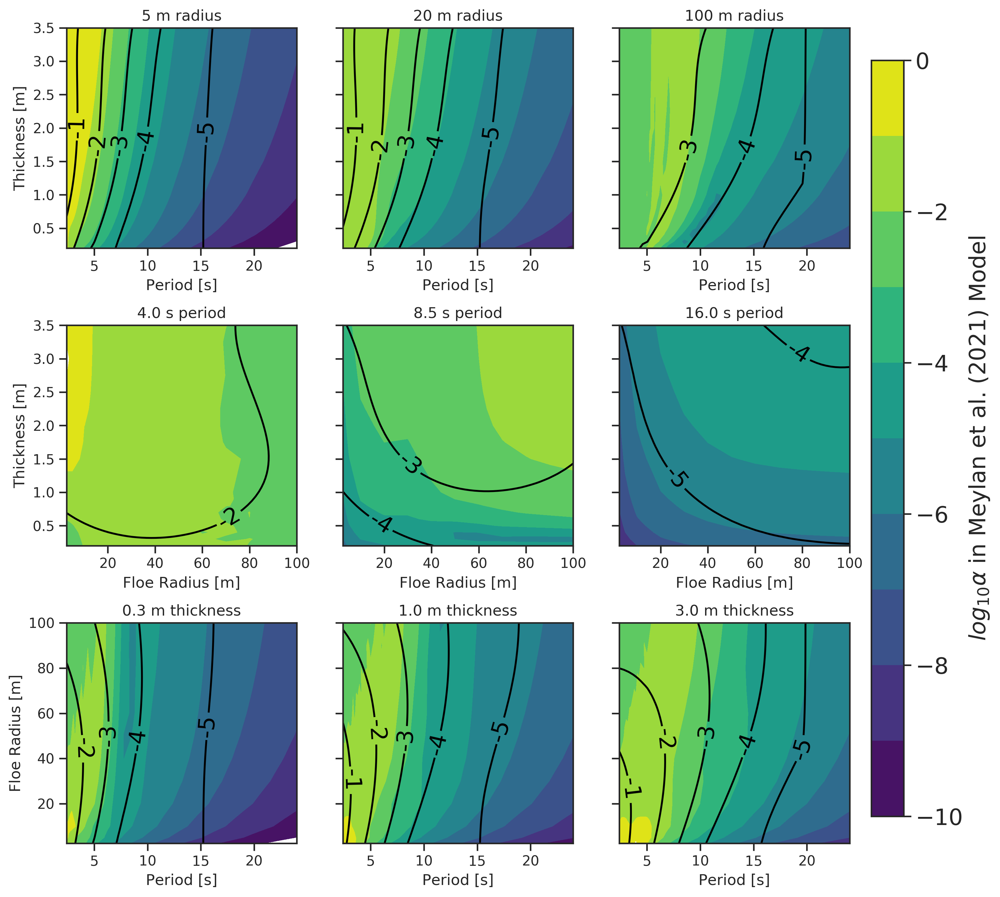

In [69]:
## combined, with additional term
table_active = table
table_active['radius'] = table_active['radius'].astype('float32')
table_active['floe_thickness'] = table_active['floe_thickness'].astype('float32')
table_active['period'] = table_active['period'].astype('float32')

with sns.axes_style('ticks'):
    fig,ax = plt.subplots(3,3,figsize=(12,12),dpi=300,sharey='row')

    #### 0,0
    plt.sca(ax[0,0])

    T = np.linspace(2.4,24,50)
    R = 5
    H = np.linspace(0.2,3.5,50)
    xT,yH = np.meshgrid(T,H)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xT,yH,log_alpha_adj(xT,R,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')


    ### meylan
    xT,yH = np.meshgrid(table_active['period'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['radius'].squeeze() - R)**2)
    print(table_active['radius'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,ind,:])
    # cs = plt.contour(xT,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    cs = plt.contourf(xT,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')

    plt.title(str(R) + ' m radius')
    plt.ylabel('Thickness [m]')
    plt.xlabel('Period [s]')


    #### 0,1
    plt.sca(ax[0,1])
    R = 20
    xT,yH = np.meshgrid(T,H)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xT,yH,log_alpha_adj(xT,R,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xT,yH = np.meshgrid(table_active['period'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['radius'].squeeze() - R)**2)
    print(table_active['radius'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,ind,:])
    # cs = plt.contour(xT,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xT,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(R) + ' m radius')
    # plt.ylabel('Thickness [m]')
    plt.xlabel('Period [s]')

    #### 0,2
    plt.sca(ax[0,2])

    T = np.linspace(2.4,24,50)
    R = 100
    H = np.linspace(0.2,3.5,50)
    xT,yH = np.meshgrid(T,H)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xT,yH,log_alpha_adj(xT,R,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xT,yH,log_alpha_adj(xT,R,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xT,yH = np.meshgrid(table_active['period'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['radius'].squeeze() - R)**2)
    print(table_active['radius'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,ind,:])
    # cs = plt.contour(xT,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xT,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(R) + ' m radius')
    # plt.ylabel('Thickness - m')
    plt.xlabel('Period [s]')

    #### Sensitize period
    #### 1,0
    plt.sca(ax[1,0])
    T = 4. #np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = np.linspace(0.2,3.5,50)
    xR,yH = np.meshgrid(R,H)
    plt.xlim(xR.min(),xR.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xR,yH,log_alpha_adj(T,xR,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xR,yH = np.meshgrid(table_active['radius'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['period'].squeeze() - T)**2)
    print(table_active['period'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,:,ind])
    # cs = plt.contour(xR,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xR,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(T) + ' s period')
    plt.ylabel('Thickness [m]')
    plt.xlabel('Floe Radius [m]')

    #### 1,1
    plt.sca(ax[1,1])
    T = 8.5 #np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = np.linspace(0.2,3.5,50)
    xR,yH = np.meshgrid(R,H)
    plt.xlim(xR.min(),xR.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xR,yH,log_alpha_adj(T,xR,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xR,yH = np.meshgrid(table_active['radius'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['period'].squeeze() - T)**2)
    print(table_active['period'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,:,ind])
    # cs = plt.contour(xR,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xR,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(T) + ' s period')
    # plt.ylabel('Thickness [m]')
    plt.xlabel('Floe Radius [m]')

    #### 1,2
    plt.sca(ax[1,2])
    T = 16. #np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = np.linspace(0.2,3.5,50)
    xR,yH = np.meshgrid(R,H)
    plt.xlim(xR.min(),xR.max())
    plt.ylim(yH.min(),yH.max())

    cs = plt.contour(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xR,yH,log_alpha_adj(T,xR,yH),levels=np.arange(-10,0.1,1),cmap='viridis')
    # plt.pcolormesh(xR,yH,log_alpha_adj(T,xR,yH),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xR,yH = np.meshgrid(table_active['radius'].squeeze(),table_active['floe_thickness'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['period'].squeeze() - T)**2)
    print(table_active['period'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][:,:,ind])
    # cs = plt.contour(xR,yH, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xR,yH, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(T) + ' s period')
    # plt.ylabel('Thickness [m]')
    plt.xlabel('Floe Radius [m]')

    #### Sensitize thickness
    #### 2,0
    plt.sca(ax[2,0])
    T = np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = 0.3 #np.linspace(0.2,3.5,50)
    xT,yR = np.meshgrid(T,R)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yR.min(),yR.max())

    cs = plt.contour(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')
    # plt.pcolormesh(xT,yR,log_alpha_adj(xT,yR,H),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xT,yR = np.meshgrid(table_active['period'].squeeze(),table_active['radius'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['floe_thickness'].squeeze() - H)**2)
    print(table_active['floe_thickness'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][ind,:,:])
    # cs = plt.contour(xT,yR, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xT,yR, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(H) + ' m thickness')
    plt.ylabel('Floe Radius [m]')
    plt.xlabel('Period [s]')

    #### 2,1
    plt.sca(ax[2,1])
    T = np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = 1.0 #np.linspace(0.2,3.5,50)
    xT,yR = np.meshgrid(T,R)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yR.min(),yR.max())

    cs = plt.contour(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # plt.contourf(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')
    # plt.pcolormesh(xT,yR,log_alpha_adj(xT,yR,H),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xT,yR = np.meshgrid(table_active['period'].squeeze(),table_active['radius'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['floe_thickness'].squeeze() - H)**2)
    print(table_active['floe_thickness'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][ind,:,:])
    # cs = plt.contour(xT,yR, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cs = plt.contourf(xT,yR, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(H) + ' m thickness')
    # plt.ylabel('Floe Radius [m]')
    plt.xlabel('Period [s]')

    #### 2,2
    plt.sca(ax[2,2])
    T = np.linspace(2.4,24,50)
    R = np.linspace(2.5,100,50)
    H = 3. #np.linspace(0.2,3.5,50)
    xT,yR = np.meshgrid(T,R)
    plt.xlim(xT.min(),xT.max())
    plt.ylim(yR.min(),yR.max())

    ######
    cs = plt.contour(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    # cm = plt.contourf(xT,yR,log_alpha_adj(xT,yR,H),levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')
    # cm = plt.pcolormesh(xT,yR,log_alpha_adj(xT,yR,H),vmin=-10,vmax=0.1,linestyles='-',cmap='viridis')

    ### meylan
    xT,yR = np.meshgrid(table_active['period'].squeeze(),table_active['radius'].squeeze())
    ## get index for desired
    ind = np.argmin((table_active['floe_thickness'].squeeze() - H)**2)
    print(table_active['floe_thickness'].squeeze()[ind])
    att = np.log10(table_active['three_d_attenuation'][ind,:,:])

    #########
    # cs = plt.contour(xT,yR, att,levels=np.arange(-10,0.1,1),colors='k',linestyles='-')
    # plt.clabel(cs, cs.levels, fmt=fmt, inline=True,fontsize='medium',colors='k')
    cm = plt.contourf(xT,yR, att,levels=np.arange(-10,0.1,1),cmap='viridis',linestyles='-')

    plt.title(str(H) + ' m thickness')
    # plt.ylabel('Floe Radius [m]')
    plt.xlabel('Period [s]')

    fig.subplots_adjust(right=0.85,hspace=.35,wspace=.2)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(cm, cax=cbar_ax)
    cbar.set_label(label=r'$log_{10} \alpha$ in Meylan et al. (2021) Model',size='medium')
    cbar.ax.tick_params(labelsize='medium')

    ###
    # plt.tight_layout()
    plt.show()

In [70]:
!pwd -P

/glade/u/home/vcooper/analysis/waveice
